# Analyzing Crime Rates in Nigeria: Patterns, Causes, and Prevention Strategies

This project seeks to analyze crime rates and disorderly events across Nigeria over a period from 2000 to 2024. By examining a comprehensive dataset from Armed Conflict Location & Event Data (ACLED), that includes various types of criminal activities such as political violence, protests, battles, and attacks on civilians, the project aims to uncover key patterns, underlying causes, and potential prevention strategies for these crimes.

The dataset contains detailed information about various events in Nigeria related to demonstrations, political violence, and other disorder types. The key columns in the dataset include:

event_date: The date of the event

year: The year the event occurred

disorder_type: The type of disorder (e.g., demonstrations, political violence)

actor1:Those involved in the events

admin1 & admin2: The State and specific Local Government Area the events occured

event_type and sub_event_type: Specific categories for the events (e.g., protests, battles, armed clashes)

location, latitude, longitude: Geographical details of the events

source: The source of information

source_scale: It indicates the scale or scope of the source(e.g National, International, Local)

fatalities: The number of fatalities

### Objectives:

1. Understanding Crime Patterns:

The project will explore the distribution of crime incidents across different geographical regions, identifying hotspots where crime rates are highest. It will also assess how these patterns have changed over time, with an emphasis on political and socio-economic factors contributing to crime rates.

2. Types of Crimes:

The dataset includes information on various types of crimes and civil disorders, including political violence, protests, and civilian-targeted attacks. Analyzing these different categories will provide insights into the nature of criminal activities in Nigeria and the factors that drive each type of disorder.

3. Actors and Victims:

The dataset provides detailed information about the actors involved in these events, such as state forces, political militias, rebel groups, and civilian protestors. Understanding the role of these actors, including any affiliations or associations, will help identify key players in crime propagation and law enforcement responses.
Victim analysis will also be crucial, examining the frequency of civilian-targeted events and the impact of crime on different communities.

4. Causes of Crime:

This section will delve into potential root causes of the observed crime patterns, including socio-economic factors such as poverty, unemployment, political instability, and communal conflicts. Other aspects, like geographical factors and government policies, will also be considered.

5. Crime Trends Over Time:

The project will analyze crime trends over the 24-year period, identifying whether crime rates have increased or decreased over time. Special attention will be given to the impact of specific political regimes, reforms, or major events such as elections and conflicts.

6. Impact of Crime on Society:

This analysis will examine how crime has affected Nigerian society, including fatalities, economic disruption, and social instability. The focus will be on both short-term impacts (e.g., immediate fatalities, displacements) and long-term effects (e.g., weakened institutions, diminished public trust).

7. The Impact of Media
The source of news and the role of media in covering crimes and bringing them to public attention will be analyzed. This includes identifying the most consistent media outlets reporting these crimes and evaluating the source scale—the reach of the media in disseminating information.
By understanding which sources consistently report crimes and how widely these reports are spread (local, national, or international), we can assess the media’s effectiveness in raising awareness and influencing public perception and response.

8. Prevention Strategies:

Based on the identified patterns and causes, the project will propose prevention strategies that can help reduce crime rates and improve safety in Nigeria. These recommendations may involve policy changes, enhanced law enforcement measures, community-driven initiatives, and strategies to address underlying socio-economic issues such as inequality and unemployment.

### Methodology:

1. Data Analysis:

The dataset will be cleaned, processed, and analyzed using statistical tools. Visualizations such as heatmaps, time series charts, and graphs will be used to display crime patterns and trends.

2. Geospatial Analysis:

Given the geographical data in the dataset, mapping tools will be used to visualize the distribution of crime events across Nigeria. This will highlight regional disparities and help identify areas most in need of intervention.


### Expected Outcomes:

1. Identification of Crime Hotspots:

By analyzing crime distributions across time and regions, this project will pinpoint the areas most affected by crime, providing a targeted approach for policymakers and law enforcement agencies.

2. Understanding the Role of Socio-Political Factors:

Through the examination of factors like poverty, political instability, and communal tensions, the project will contribute to a deeper understanding of why crime occurs and how these factors can be addressed.

3. Recommendations for Policy and Law Enforcement:

Based on the data, the project will offer actionable recommendations for crime prevention, including potential law enforcement reforms, socio-economic interventions, and community-level solutions to reduce crime and improve public safety.

4. Crime Prevention Framework:

A proposed framework for ongoing monitoring and prevention of crime in Nigeria will be outlined, allowing for sustainable strategies that can be adapted over time to meet changing conditions.

### Conclusion:
This project is crucial in shedding light on the complex issue of crime in Nigeria, where various socio-political and economic factors contribute to the country's security challenges. The analysis of this 24-year dataset will provide valuable insights into crime patterns, causes, and strategies for prevention, helping to build a safer, more stable Nigeria for the future.

### Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from wordcloud import WordCloud
from scipy.stats import chi2_contingency
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

### Importing the dataset

In [2]:
NigeriaCrimeData = pd.read_excel(r'C:\Users\ADMIN\Documents\Diff. format of files\2000-01-01-2024-10-06-Western_Africa-Nigeria.xlsx')

### Displaying dataset

In [3]:
NigeriaCrimeData

,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,civilian_targeting,iso,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp
0,NIG38646,2024-09-27,2024,2,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),NaN,Protesters,NaN,NaN,NaN,Protesters only,NaN,566,Western Africa,Nigeria,Enugu,Enugu North,NaN,Enugu,6.4426,7.5022,1,Guardian (Nigeria),National,"Around 27 September 2024 (as reported), hundre...",0,crowd size=hundreds,1727907808
1,NIG38682,2024-09-27,2024,2,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),NaN,State forces,Katsina Communal Militia (Nigeria),NaN,Identity militia,State forces-Identity militia,NaN,566,Western Africa,Nigeria,Katsina,Kankara,NaN,Kankara,11.9302,7.4127,2,Twitter,New media,"Around 27 September 2024, the Nigerian troops ...",10,NaN,1727907809
2,NIG38717,2024-09-27,2024,2,Political violence,Battles,Armed clash,Unidentified Cult Militia (Nigeria),NaN,Political militia,Unidentified Cult Militia (Nigeria),NaN,Political militia,Political militia-Political militia,NaN,566,Western Africa,Nigeria,Imo,Ohaji,NaN,Awara,5.3504,6.7675,2,Nigeria Punch,National,"Around 27 September 2024 (as reported), two un...",8,NaN,1727907809
3,NIG38645,2024-09-26,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Katsina Communal Militia (Nigeria),NaN,Identity militia,Civilians (Nigeria),Farmers (Nigeria); Women (Nigeria),Civilians,Identity militia-Civilians,Civilian targeting,566,Western Africa,Nigeria,Katsina,Jibia,NaN,Jibia,13.0978,7.2225,2,Daily Independent (Nigeria); Daily Leadership ...,National,"On 26 September 2024, a Katsina militia abduct...",0,NaN,1727907808
4,NIG38667,2024-09-25,2024,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,NaN,Rebel group,Civilians (Nigeria),NaN,Civilians,Rebel group-Civilians,Civilian targeting,566,Western Africa,Nigeria,Borno,Marte,NaN,Marte,12.3611,13.8246,2,Whatsapp,New media,"On 25 September 2024, IS/BH (JAS) shot and kil...",1,NaN,1727907809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37654,NIG522,2000-01-06,2000,1,Political violence,Battles,Armed clash,Ife Ethnic Militia (Nigeria),NaN,Identity militia,Modakeke Ethnic Militia (Nigeria),NaN,Identity militia,Identity militia-Identity militia,NaN,566,Western Africa,Nigeria,Osun,Ife East,NaN,Ife-Ife,7.4667,4.5667,2,Dow Jones International,International,Six are killed in Ife when the community encou...,6,NaN,1572403713
37655,NIG523,2000-01-06,2000,1,Political violence,Battles,Armed clash,Ife Ethnic Militia (Nigeria),NaN,Identity militia,Modakeke Ethnic Militia (Nigeria),NaN,Identity militia,Identity militia-Identity militia,NaN,566,Western Africa,Nigeria,Osun,Irewole,NaN,Modakeke,7.3833,4.2667,1,Dow Jones International,International,Six are killed in Modakeke when the community ...,6,NaN,1572403713
37656,NIG524,2000-01-06,2000,1,Political violence,Battles,Armed clash,Unidentified Armed Group (Nigeria),NaN,Political militia,Police Forces of Nigeria (1999-2015),NaN,State forces,State forces-Political militia,NaN,566,Western Africa,Nigeria,Bayelsa,Sagbama,NaN,Niger Delta,4.8966,6.0744,1,Reuters,International,Five are dead in a clash between militant yout...,5,NaN,1712617357
37657,NIG520,2000-01-03,2000,3,Political violence,Violence against civilians,Attack,Muslim Militia (Nigeria),NaN,Identity militia,Civilians (Nigeria),Students (Nigeria),Civilians,Identity militia-Civilians,Civilian targeting,566,Western Africa,Nigeria,Sokoto,Wamakko,NaN,Sokoto,13.0480,5.2143,2,Africa Research Bulletin,Other,Groups of Muslim students become violent deman...,0,NaN,1618566561


### Displaying the first five rows of dataset

In [4]:
NigeriaCrimeData.head()

,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,civilian_targeting,iso,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp
0,NIG38646,2024-09-27,2024,2,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),NaN,Protesters,NaN,NaN,NaN,Protesters only,NaN,566,Western Africa,Nigeria,Enugu,Enugu North,NaN,Enugu,6.4426,7.5022,1,Guardian (Nigeria),National,"Around 27 September 2024 (as reported), hundre...",0,crowd size=hundreds,1727907808
1,NIG38682,2024-09-27,2024,2,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),NaN,State forces,Katsina Communal Militia (Nigeria),NaN,Identity militia,State forces-Identity militia,NaN,566,Western Africa,Nigeria,Katsina,Kankara,NaN,Kankara,11.9302,7.4127,2,Twitter,New media,"Around 27 September 2024, the Nigerian troops ...",10,NaN,1727907809
2,NIG38717,2024-09-27,2024,2,Political violence,Battles,Armed clash,Unidentified Cult Militia (Nigeria),NaN,Political militia,Unidentified Cult Militia (Nigeria),NaN,Political militia,Political militia-Political militia,NaN,566,Western Africa,Nigeria,Imo,Ohaji,NaN,Awara,5.3504,6.7675,2,Nigeria Punch,National,"Around 27 September 2024 (as reported), two un...",8,NaN,1727907809
3,NIG38645,2024-09-26,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Katsina Communal Militia (Nigeria),NaN,Identity militia,Civilians (Nigeria),Farmers (Nigeria); Women (Nigeria),Civilians,Identity militia-Civilians,Civilian targeting,566,Western Africa,Nigeria,Katsina,Jibia,NaN,Jibia,13.0978,7.2225,2,Daily Independent (Nigeria); Daily Leadership ...,National,"On 26 September 2024, a Katsina militia abduct...",0,NaN,1727907808
4,NIG38667,2024-09-25,2024,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,NaN,Rebel group,Civilians (Nigeria),NaN,Civilians,Rebel group-Civilians,Civilian targeting,566,Western Africa,Nigeria,Borno,Marte,NaN,Marte,12.3611,13.8246,2,Whatsapp,New media,"On 25 September 2024, IS/BH (JAS) shot and kil...",1,NaN,1727907809


### Replacing the index using the Event ID

In [5]:
NigeriaCrimeData.set_index('event_id_cnty', inplace = True)

In [6]:
NigeriaCrimeData

,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,actor2,assoc_actor_2,inter2,interaction,civilian_targeting,iso,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp
event_id_cnty,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
NIG38646,2024-09-27,2024,2,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),NaN,Protesters,NaN,NaN,NaN,Protesters only,NaN,566,Western Africa,Nigeria,Enugu,Enugu North,NaN,Enugu,6.4426,7.5022,1,Guardian (Nigeria),National,"Around 27 September 2024 (as reported), hundre...",0,crowd size=hundreds,1727907808
NIG38682,2024-09-27,2024,2,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),NaN,State forces,Katsina Communal Militia (Nigeria),NaN,Identity militia,State forces-Identity militia,NaN,566,Western Africa,Nigeria,Katsina,Kankara,NaN,Kankara,11.9302,7.4127,2,Twitter,New media,"Around 27 September 2024, the Nigerian troops ...",10,NaN,1727907809
NIG38717,2024-09-27,2024,2,Political violence,Battles,Armed clash,Unidentified Cult Militia (Nigeria),NaN,Political militia,Unidentified Cult Militia (Nigeria),NaN,Political militia,Political militia-Political militia,NaN,566,Western Africa,Nigeria,Imo,Ohaji,NaN,Awara,5.3504,6.7675,2,Nigeria Punch,National,"Around 27 September 2024 (as reported), two un...",8,NaN,1727907809
NIG38645,2024-09-26,2024,1,Political violence,Violence against civilians,Abduction/forced disappearance,Katsina Communal Militia (Nigeria),NaN,Identity militia,Civilians (Nigeria),Farmers (Nigeria); Women (Nigeria),Civilians,Identity militia-Civilians,Civilian targeting,566,Western Africa,Nigeria,Katsina,Jibia,NaN,Jibia,13.0978,7.2225,2,Daily Independent (Nigeria); Daily Leadership ...,National,"On 26 September 2024, a Katsina militia abduct...",0,NaN,1727907808
NIG38667,2024-09-25,2024,1,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,NaN,Rebel group,Civilians (Nigeria),NaN,Civilians,Rebel group-Civilians,Civilian targeting,566,Western Africa,Nigeria,Borno,Marte,NaN,Marte,12.3611,13.8246,2,Whatsapp,New media,"On 25 September 2024, IS/BH (JAS) shot and kil...",1,NaN,1727907809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NIG522,2000-01-06,2000,1,Political violence,Battles,Armed clash,Ife Ethnic Militia (Nigeria),NaN,Identity militia,Modakeke Ethnic Militia (Nigeria),NaN,Identity militia,Identity militia-Identity militia,NaN,566,Western Africa,Nigeria,Osun,Ife East,NaN,Ife-Ife,7.4667,4.5667,2,Dow Jones International,International,Six are killed in Ife when the community encou...,6,NaN,1572403713
NIG523,2000-01-06,2000,1,Political violence,Battles,Armed clash,Ife Ethnic Militia (Nigeria),NaN,Identity militia,Modakeke Ethnic Militia (Nigeria),NaN,Identity militia,Identity militia-Identity militia,NaN,566,Western Africa,Nigeria,Osun,Irewole,NaN,Modakeke,7.3833,4.2667,1,Dow Jones International,International,Six are killed in Modakeke when the community ...,6,NaN,1572403713
NIG524,2000-01-06,2000,1,Political violence,Battles,Armed clash,Unidentified Armed Group (Nigeria),NaN,Political militia,Police Forces of Nigeria (1999-2015),NaN,State forces,State forces-Political militia,NaN,566,Western Africa,Nigeria,Bayelsa,Sagbama,NaN,Niger Delta,4.8966,6.0744,1,Reuters,International,Five are dead in a clash between militant yout...,5,NaN,1712617357


### Checking the size of the dataset 
**The dataset has 37659 rows and 30 columns**

In [7]:
NigeriaCrimeData.shape

(37659, 30)

### Checking important information of the dataset
**The Columns, Non-null values of the column and the data types were displayed**

In [8]:
NigeriaCrimeData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37659 entries, NIG38646 to NIG519
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   event_date          37659 non-null  datetime64[ns]
 1   year                37659 non-null  int64         
 2   time_precision      37659 non-null  int64         
 3   disorder_type       37659 non-null  object        
 4   event_type          37659 non-null  object        
 5   sub_event_type      37659 non-null  object        
 6   actor1              37659 non-null  object        
 7   assoc_actor_1       10127 non-null  object        
 8   inter1              37659 non-null  object        
 9   actor2              29186 non-null  object        
 10  assoc_actor_2       8755 non-null   object        
 11  inter2              29186 non-null  object        
 12  interaction         37659 non-null  object        
 13  civilian_targeting  14838 non-null  object 

### Checking for null values in the dataset
**The following have null values: assoc_actor_1, actor2, assoc_actor_2, inter2, civilian_targeting, admin1, admin2, admin3 and tags**

In [9]:
NigeriaCrimeData.isnull().sum()

event_date                0
year                      0
time_precision            0
disorder_type             0
event_type                0
sub_event_type            0
actor1                    0
assoc_actor_1         27532
inter1                    0
actor2                 8473
assoc_actor_2         28904
inter2                 8473
interaction               0
civilian_targeting    22821
iso                       0
region                    0
country                   0
admin1                    1
admin2                    1
admin3                37659
location                  0
latitude                  0
longitude                 0
geo_precision             0
source                    0
source_scale              0
notes                     0
fatalities                0
tags                  30128
timestamp                 0
dtype: int64

### Displaying all columns for a better understanding of the key ones for the project
**I found out that some columns are unnecessary for this particular project**

In [10]:
NigeriaCrimeData.columns

Index(['event_date', 'year', 'time_precision', 'disorder_type', 'event_type',
       'sub_event_type', 'actor1', 'assoc_actor_1', 'inter1', 'actor2',
       'assoc_actor_2', 'inter2', 'interaction', 'civilian_targeting', 'iso',
       'region', 'country', 'admin1', 'admin2', 'admin3', 'location',
       'latitude', 'longitude', 'geo_precision', 'source', 'source_scale',
       'notes', 'fatalities', 'tags', 'timestamp'],
      dtype='object')

### Choosing the necessary columns for the project
**I dropped the columns that are irrelevant to the analysis**

In [11]:
NigeriaCrimeData = NigeriaCrimeData[['event_date', 'year','disorder_type', 'event_type','sub_event_type',
         'actor1','admin1', 'admin2', 'location','latitude', 'longitude', 'source', 'source_scale','fatalities']]

### Checking for null values in the dataset
**I checked for null values in the necessary and useful columns left** 

In [12]:
NigeriaCrimeData.isnull().sum()

event_date        0
year              0
disorder_type     0
event_type        0
sub_event_type    0
actor1            0
admin1            1
admin2            1
location          0
latitude          0
longitude         0
source            0
source_scale      0
fatalities        0
dtype: int64

### Dropping rows with missing values in admin1 or admin2

In [13]:
NigeriaCrimeData = NigeriaCrimeData.dropna(subset=['admin1', 'admin2'])

### Re-Checking for null values in the dataset
**The dataset is now clean and good for analysis**

In [14]:
NigeriaCrimeData.isnull().sum()

event_date        0
year              0
disorder_type     0
event_type        0
sub_event_type    0
actor1            0
admin1            0
admin2            0
location          0
latitude          0
longitude         0
source            0
source_scale      0
fatalities        0
dtype: int64

### Checking the data types to be sure it is accurate
**The columns correlate with the data types**

In [15]:
NigeriaCrimeData.dtypes

event_date        datetime64[ns]
year                       int64
disorder_type             object
event_type                object
sub_event_type            object
actor1                    object
admin1                    object
admin2                    object
location                  object
latitude                 float64
longitude                float64
source                    object
source_scale              object
fatalities                 int64
dtype: object

### Creating a new column called "month"
**I brought out the month from the "event_date" column since it will be used for the analysis**

In [16]:
NigeriaCrimeData['month'] = NigeriaCrimeData['event_date'].dt.strftime('%B')

### Displaying the dataset 
**It was confirmed that the 'month' is already included in the dataset**

In [17]:
NigeriaCrimeData.head()

,event_date,year,disorder_type,event_type,sub_event_type,actor1,admin1,admin2,location,latitude,longitude,source,source_scale,fatalities,month
event_id_cnty,,,,,,,,,,,,,,,
NIG38646,2024-09-27,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Enugu,Enugu North,Enugu,6.4426,7.5022,Guardian (Nigeria),National,0,September
NIG38682,2024-09-27,2024,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),Katsina,Kankara,Kankara,11.9302,7.4127,Twitter,New media,10,September
NIG38717,2024-09-27,2024,Political violence,Battles,Armed clash,Unidentified Cult Militia (Nigeria),Imo,Ohaji,Awara,5.3504,6.7675,Nigeria Punch,National,8,September
NIG38645,2024-09-26,2024,Political violence,Violence against civilians,Abduction/forced disappearance,Katsina Communal Militia (Nigeria),Katsina,Jibia,Jibia,13.0978,7.2225,Daily Independent (Nigeria); Daily Leadership ...,National,0,September
NIG38667,2024-09-25,2024,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,Borno,Marte,Marte,12.3611,13.8246,Whatsapp,New media,1,September


### Creating a new column called "geopolitical_zones"
**As I brainstormed the analysis, I realized that the Geopolitical zone of the event's State would be utilized**

In [18]:
geopolitical_zones = {
    'South West': ['Ekiti', 'Lagos', 'Ogun', 'Ondo', 'Osun', 'Oyo'],
    'South East': ['Abia', 'Anambra', 'Ebonyi', 'Enugu', 'Imo'],
    'South South': ['Akwa Ibom', 'Bayelsa', 'Cross River', 'Delta', 'Edo', 'Rivers'],
    'North Central': ['Benue', 'Kogi', 'Kwara', 'Nasarawa', 'Niger', 'Plateau', 'Federal Capital Territory'],
    'North East': ['Adamawa', 'Bauchi', 'Borno', 'Gombe', 'Taraba', 'Yobe'],
    'North West': ['Jigawa', 'Kaduna', 'Kano', 'Katsina', 'Kebbi', 'Sokoto', 'Zamfara']
}


state_to_zone = {state: zone for zone, states in geopolitical_zones.items() for state in states}

def assign_geopolitical_zone(state):
    return state_to_zone.get(state, 'Unknown')  

NigeriaCrimeData['geopolitical_zone'] = NigeriaCrimeData['admin1'].apply(assign_geopolitical_zone)


### Displaying the first twenty columns

In [19]:
NigeriaCrimeData.head(20)

,event_date,year,disorder_type,event_type,sub_event_type,actor1,admin1,admin2,location,latitude,longitude,source,source_scale,fatalities,month,geopolitical_zone
event_id_cnty,,,,,,,,,,,,,,,,
NIG38646,2024-09-27,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Enugu,Enugu North,Enugu,6.4426,7.5022,Guardian (Nigeria),National,0,September,South East
NIG38682,2024-09-27,2024,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),Katsina,Kankara,Kankara,11.9302,7.4127,Twitter,New media,10,September,North West
NIG38717,2024-09-27,2024,Political violence,Battles,Armed clash,Unidentified Cult Militia (Nigeria),Imo,Ohaji,Awara,5.3504,6.7675,Nigeria Punch,National,8,September,South East
NIG38645,2024-09-26,2024,Political violence,Violence against civilians,Abduction/forced disappearance,Katsina Communal Militia (Nigeria),Katsina,Jibia,Jibia,13.0978,7.2225,Daily Independent (Nigeria); Daily Leadership ...,National,0,September,North West
NIG38667,2024-09-25,2024,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,Borno,Marte,Marte,12.3611,13.8246,Whatsapp,New media,1,September,North East
NIG38690,2024-09-25,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Edo,Oredo,Benin City,6.3351,5.6275,Vanguard (Nigeria),National,0,September,South South
NIG38691,2024-09-25,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Osun,Osogbo,Oshogbo,7.7667,4.5667,Daily Champion,National,0,September,South West
NIG38702,2024-09-25,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Lagos,Alimosho,Ipaja,6.6088,3.2545,Daily Trust (Nigeria); Vanguard (Nigeria),National,0,September,South West
NIG38684,2024-09-24,2024,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),Zamfara,Maru,Dan Sadau,11.2962,6.4952,Daily Post (Nigeria); Daily Trust (Nigeria); I...,National,16,September,North West


### Counting the number of unique values in each column

In [20]:
NigeriaCrimeData.nunique()

event_date           6150
year                   25
disorder_type           4
event_type              6
sub_event_type         24
actor1                847
admin1                 37
admin2                751
location             5110
latitude             4930
longitude            5006
source               2783
source_scale           23
fatalities            132
month                  12
geopolitical_zone       7
dtype: int64

## Exploratory Data Analysis

### Analyzing the frequency of different disorder types

#### Counting the number of occurrences of each type of disorder

In [21]:
disorder_type_counts = NigeriaCrimeData['disorder_type'].value_counts()
disorder_type_counts

disorder_type
Political violence                    26713
Demonstrations                         8951
Strategic developments                 1806
Political violence; Demonstrations      188
Name: count, dtype: int64

**I discovered that "political violence" is significantly more prevalent than other types of disorder**

The bar chart shows the frequency of different types of disorders in Nigeria. This provides insight into the most common disorder types, 
which is political violence

#### Plotting the distribution of different disorder types

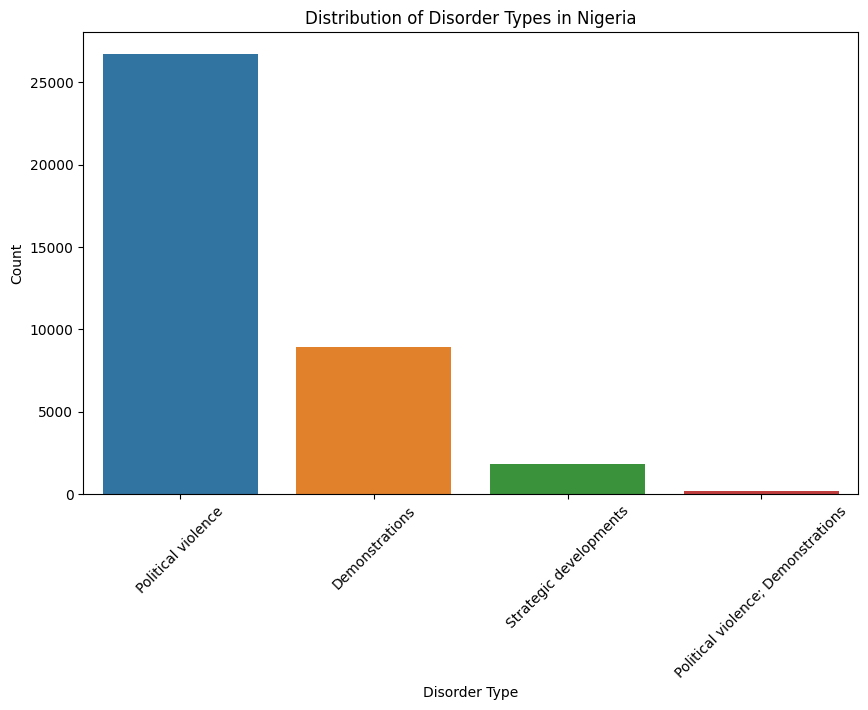

In [22]:
plt.figure(figsize=(10, 6))
sns.barplot(x=disorder_type_counts.index, y=disorder_type_counts.values)
plt.title('Distribution of Disorder Types in Nigeria')
plt.xlabel('Disorder Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

### Analyzing trends over time (by year)

In [23]:
yearly_trends = NigeriaCrimeData.groupby('year').size()

In [24]:
yearly_trends

year
2000     166
2001     121
2002     152
2003     203
2004     276
2005     198
2006     120
2007     194
2008     196
2009     225
2010     472
2011     344
2012     920
2013    1049
2014    1526
2015    1685
2016    1408
2017    1642
2018    2049
2019    2439
2020    3944
2021    4599
2022    4923
2023    4712
2024    4095
dtype: int64

The line chart illustrates the year-over-year changes in the number of events, revealing a significant upward trend in crime rates in Nigeria since 2000. This trend indicates that crime has consistently increased over the years, highlighting growing concerns about safety and security in the country

#### Plotting crime trends over time

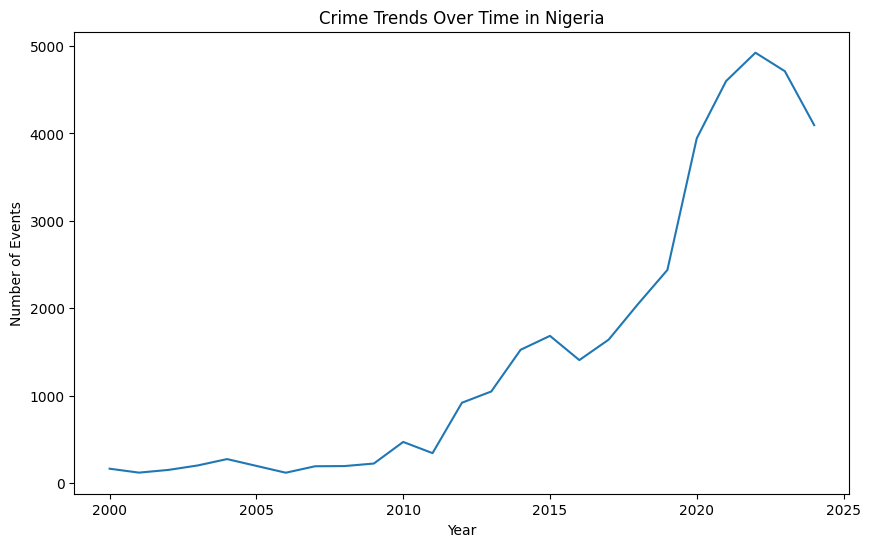

In [25]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=yearly_trends.index, y=yearly_trends.values)
plt.title('Crime Trends Over Time in Nigeria')
plt.xlabel('Year')
plt.ylabel('Number of Events')
plt.show()

### Analyzing the frequency of different event types

#### Counting the number of occurrences of each type of event

In [26]:
event_type_counts = NigeriaCrimeData['event_type'].value_counts()

In [27]:
event_type_counts

event_type
Violence against civilians    13031
Battles                        9822
Protests                       7698
Riots                          3400
Explosions/Remote violence     1901
Strategic developments         1806
Name: count, dtype: int64

**I observed that "Violence against civilians" is the most frequent crime type: It appears the most often, suggesting that it is the most prevalent crime in Nigeria**

The count plot(horizontal bar plot) plot provides a visual representation of the distribution of different crime types in the country

#### Plotting Crime Type Distribution

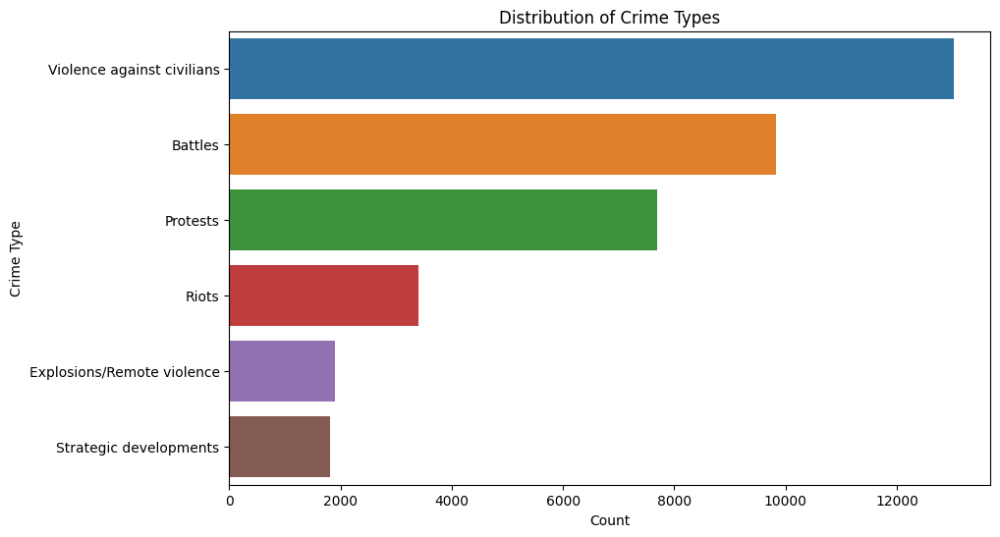

In [28]:
plt.figure(figsize=(10, 6))
sns.countplot(y='event_type', data=NigeriaCrimeData, order=NigeriaCrimeData['event_type'].value_counts().index)
plt.title('Distribution of Crime Types')
plt.xlabel('Count')
plt.ylabel('Crime Type')
plt.show()

### Analyzing the frequency of different sub_event_type

#### Counting the number of occurrences of each type of sub event

In [29]:
sub_event_type_counts = NigeriaCrimeData['sub_event_type'].value_counts()

In [30]:
sub_event_type_counts

sub_event_type
Attack                                 10042
Armed clash                             9465
Peaceful protest                        7069
Abduction/forced disappearance          2868
Mob violence                            1959
Violent demonstration                   1441
Looting/property destruction             825
Air/drone strike                         816
Remote explosive/landmine/IED            679
Protest with intervention                441
Government regains territory             297
Suicide bomb                             276
Change to group/activity                 218
Excessive force against protesters       188
Other                                    179
Disrupted weapons use                    166
Arrests                                  163
Agreement                                145
Sexual violence                          121
Shelling/artillery/missile attack        108
Non-violent transfer of territory         91
Non-state actor overtakes territory     

**Attack, Armed clash and Peaceful protest are the most common specific crime types: They appear most frequently in the indicating that these crimes are particularly prevalent.**

The count plot(horizontal bar plot) plot provides a visual representation of the distribution of specific different crime types in the country

 #### Plotting Specific Crime Type Distribution (sub_event_type)

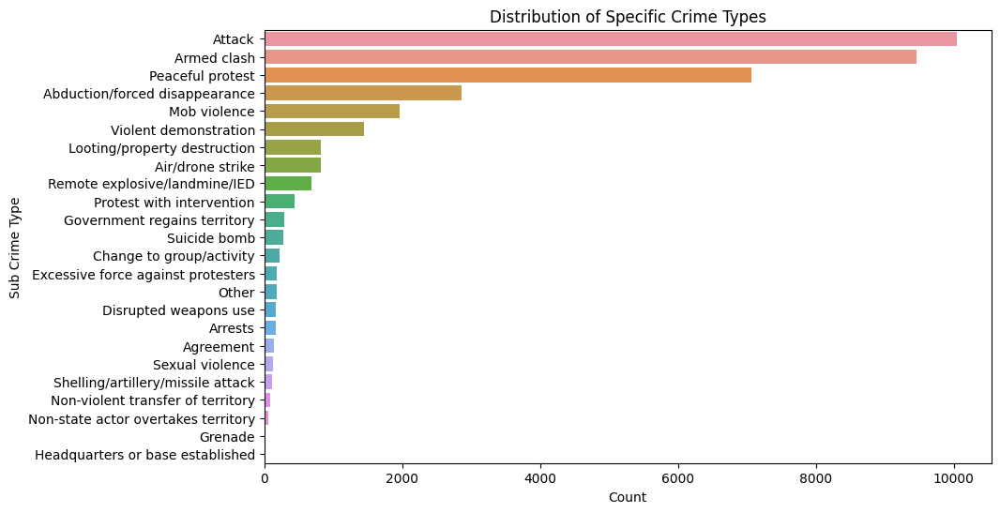

In [31]:
plt.figure(figsize=(10, 6))
sns.countplot(y='sub_event_type', data=NigeriaCrimeData, order=NigeriaCrimeData['sub_event_type'].value_counts().index)
plt.title('Distribution of Specific Crime Types')
plt.xlabel('Count')
plt.ylabel('Sub Crime Type')
plt.show()

### Analyzing Crime by State

#### Counting the number of crimes per State

In [32]:
crime_counts = NigeriaCrimeData['admin1'].value_counts()

In [33]:
crime_counts

admin1
Borno                        5615
Kaduna                       2424
Lagos                        2007
Federal Capital Territory    1872
Delta                        1684
Zamfara                      1589
Rivers                       1520
Plateau                      1386
Katsina                      1347
Benue                        1346
Anambra                      1111
Niger                        1049
Edo                           964
Imo                           917
Ogun                          842
Bayelsa                       814
Oyo                           776
Taraba                        748
Ondo                          727
Osun                          720
Enugu                         719
Adamawa                       697
Yobe                          640
Kogi                          609
Sokoto                        600
Cross River                   580
Nassarawa                     577
Kano                          527
Abia                          526
Akwa Ib

**Crime occurred the most in Borno State in the North East geopolitical zone in the last 24 years**

The plot shows distribution of crime across the 36 states and the Federal Capital Territory in Nigeria and their corresponding crime frequency

#### Plotting Crime by State(admin1)

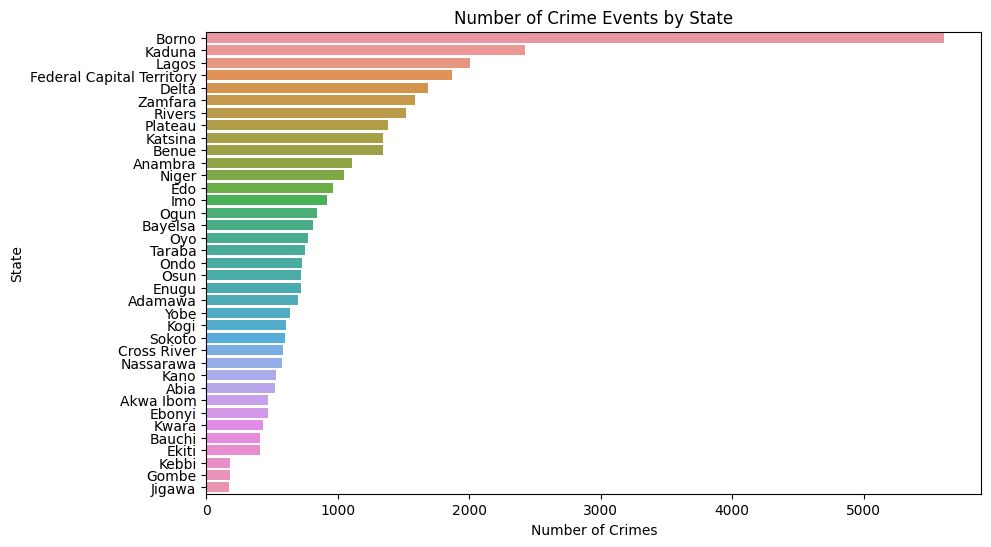

In [34]:
plt.figure(figsize=(10, 6))
sns.countplot(y='admin1', data=NigeriaCrimeData, order=NigeriaCrimeData['admin1'].value_counts().index)
plt.title('Number of Crime Events by State')
plt.xlabel('Number of Crimes')
plt.ylabel('State')
plt.show()

### Analyzing Monthly Crime Trends over the Years

#### Counting the number of crimes by month

In [35]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

NigeriaCrimeData['month'] = pd.Categorical(NigeriaCrimeData['month'], categories=month_order, ordered=True)

crime_counts = NigeriaCrimeData['month'].value_counts().sort_index()
crime_counts


month
January      3437
February     3316
March        3454
April        3317
May          3438
June         3236
July         3204
August       3243
September    2719
October      2823
November     2712
December     2759
Name: count, dtype: int64

**It was observed that crimes predominantly occur at the beginning of each year.**

The line graph clearly shows that at the beginning of each month, there is a downward trend in crime, illustrating that crime decreases as the month progresses.


#### Plotting Monthly Crime Trends Across the Years

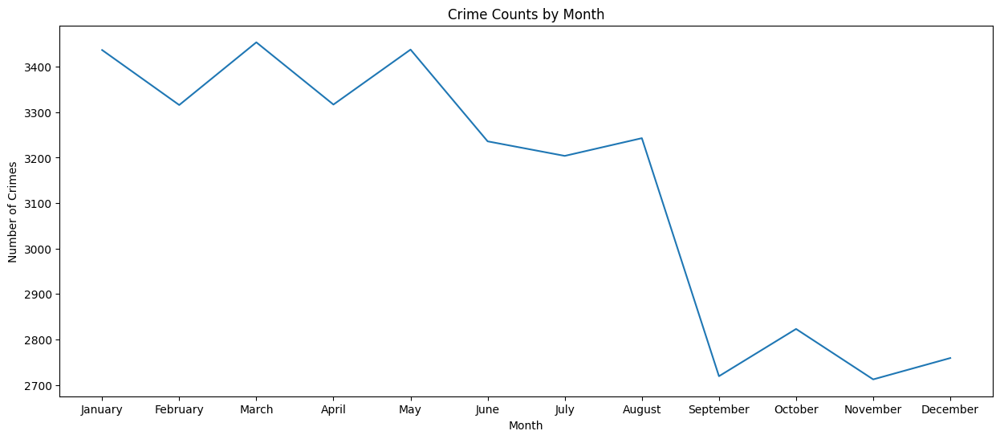

In [36]:
plt.figure(figsize=(15, 6))
sns.lineplot(x=crime_counts.index, y=crime_counts.values)
plt.title('Crime Counts by Month')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.show()

### Analyzing Crime per Geopololitical Zones

#### Counting the number of crimes by geopolitical zones

In [37]:
crime_counts = NigeriaCrimeData['geopolitical_zone'].value_counts()

In [38]:
crime_counts

geopolitical_zone
North East       8288
North West       6842
North Central    6692
South South      6034
South West       5480
South East       3745
Unknown           577
Name: count, dtype: int64

**I observed that the northern part of Nigeria has been severely affected by crime over the past 23 years, with the North East experiencing the highest rates, followed by the North West and then the North Central regions. In contrast, the South East has maintained relatively low crime levels during this period compared to other regions**

The horizontal bar chart illustrates the distribution of crimes across different regions over the years

#### Plotting Crimes by Geopolitical Zone

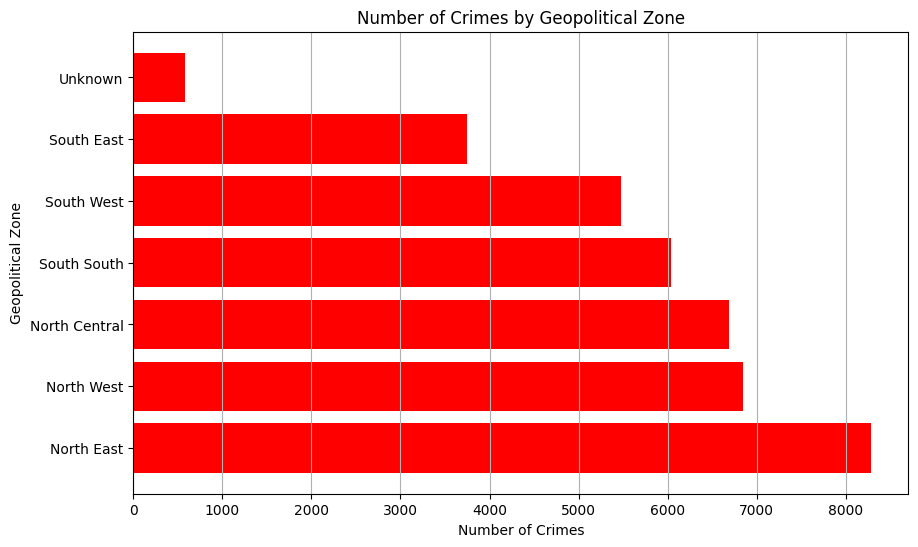

In [39]:
plt.figure(figsize=(10, 6))
plt.barh(crime_counts.index, crime_counts.values, color='red')
plt.title('Number of Crimes by Geopolitical Zone')
plt.xlabel('Number of Crimes')
plt.ylabel('Geopolitical Zone')
plt.grid(axis='x')
plt.show()

#### Heatmap of Geopolitical Zones and Crimes

**The heatmap effectively illustrates the distribution of various crime types across different geopolitical zones in Nigeria.** 
### Conclusion on Regional Crime Dynamics

Based on the data analysis of crime types across Nigeria's geopolitical zones, the following dynamics emerge:

1. **Battles**:
   - The **North East** experiences the highest frequency of battles, indicating ongoing conflicts or insurgencies in that region. 
   - This is followed by the **North West**, suggesting significant unrest or violence in that area as well.
   - The **North Central** and **South South** also report battles, but at lower frequencies, highlighting a regional disparity in conflict.

2. **Protests**:
   - Protests are predominantly organized in the **South West**, indicating a higher level of civic engagement or dissent in that region.
   - The **South South** follows, suggesting that this area also has active civil movements.
   - The **North Central** shows some occurrences of protests, but less so than the southern regions.

3. **Violence Against Civilians**:
   - The **North West** records the highest levels of violence against civilians, raising concerns about safety and security for residents.
   - The **North Central** and **North East** also have significant incidents, indicating that violence is a widespread issue in northern Nigeria.
   - The **South South**, **South East**, and **South West** report lower levels of violence against civilians, suggesting comparatively safer environments in these regions.

### Overall Implications
The regional disparities in crime dynamics underscore the need for tailored policy responses. Areas with high incidences of battles and violence may require focused interventions, such as peacekeeping and community support programs. Conversely, regions with higher protest activity might benefit from engagement strategies to address grievances and promote dialogue. Understanding these dynamics is crucial for effective governance and resource allocation in Nigeria.

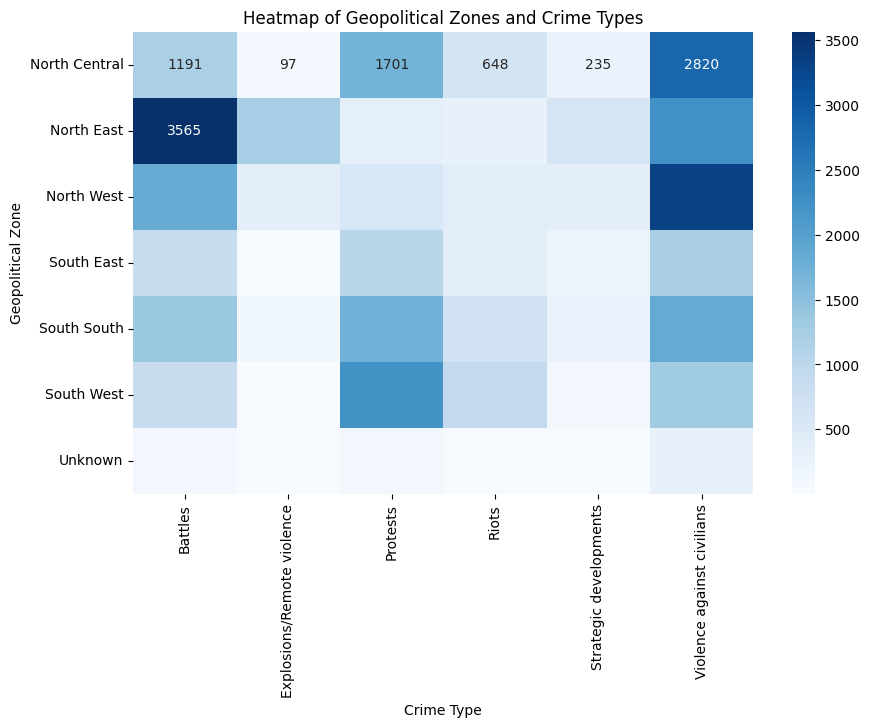

In [40]:
plt.figure(figsize=(10, 6))
geo_crime = pd.crosstab(NigeriaCrimeData['geopolitical_zone'], NigeriaCrimeData['event_type'])
sns.heatmap(geo_crime, cmap='Blues', annot=True, fmt='d')
plt.title('Heatmap of Geopolitical Zones and Crime Types')
plt.xlabel('Crime Type')
plt.ylabel('Geopolitical Zone')
plt.show()

### Calculating the Total number of fatalities in Nigeria

In [41]:
total_sum = NigeriaCrimeData['fatalities'].sum()
print(f'The total number of fatalities in Nigeria since 2000 according to the report is {total_sum}')

The total number of fatalities in Nigeria since 2000 according to the report is 116590


### Analyzing fatalities in Nigeria

#### Fatalities Distribution

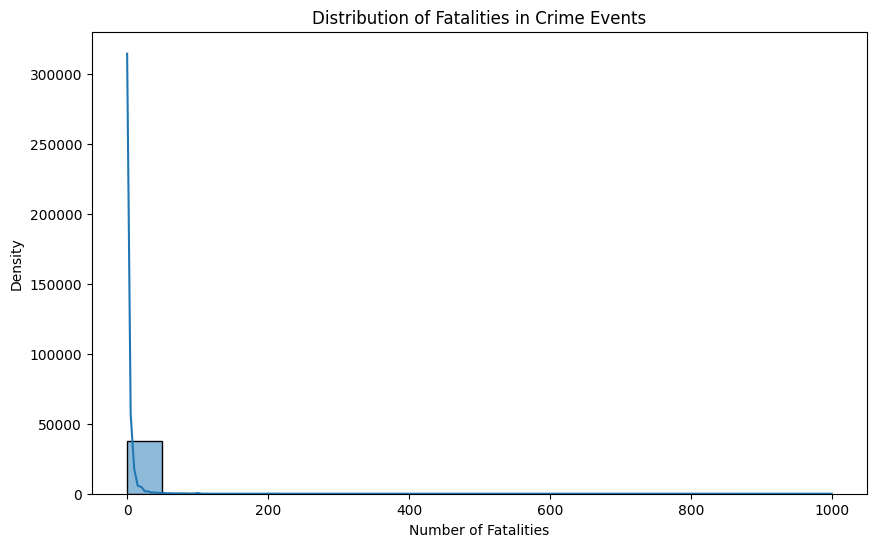

In [42]:
plt.figure(figsize=(10, 6))
sns.histplot(NigeriaCrimeData['fatalities'], bins=20, kde=True)
plt.title('Distribution of Fatalities in Crime Events')
plt.xlabel('Number of Fatalities')
plt.ylabel('Density')
plt.show()

#### Plotting Fatalities by Crime Type

**The boxplot visualizing fatalities by crime type provides insightful information about the impact of different crime events in Nigeria:**

The boxplot reveals how fatalities vary across different crime types. Voilence against civilians has the higher fatalities. 

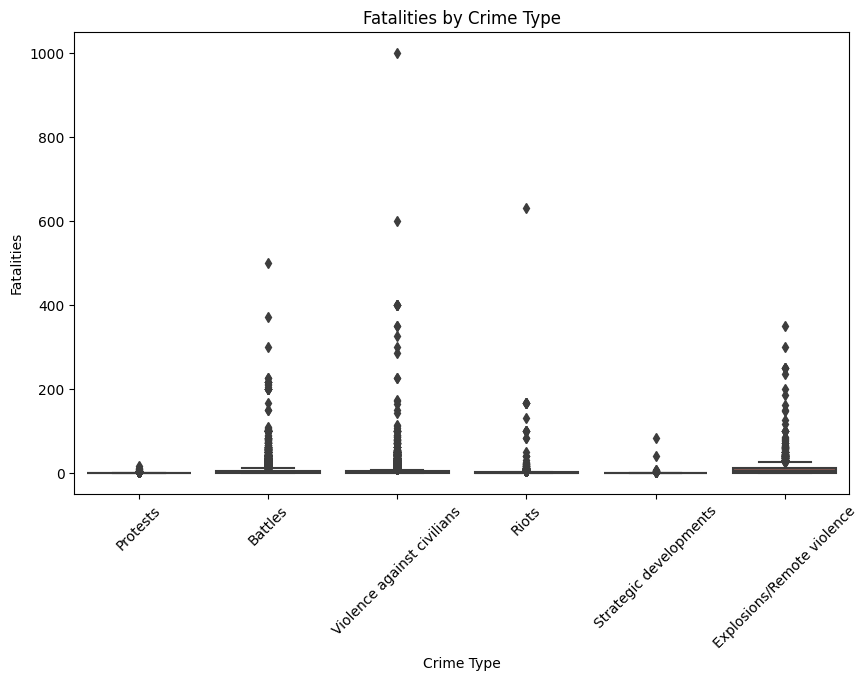

In [43]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='event_type', y='fatalities', data=NigeriaCrimeData)
plt.title('Fatalities by Crime Type')
plt.xlabel('Crime Type')
plt.ylabel('Fatalities')
plt.xticks(rotation=45)
plt.show()

#### Calculating the average fatalities by geopolitical zone

**The chart highlights significant differences in average fatalities across regions. The North East is the most affected, followed by the North West and then the North Central**

In [44]:
average_fatalities = NigeriaCrimeData.groupby('geopolitical_zone')['fatalities'].mean().reset_index()

In [45]:
average_fatalities

,geopolitical_zone,fatalities
0,North Central,2.924238
1,North East,6.338682
2,North West,4.026747
3,South East,1.225901
4,South South,1.203679
5,South West,0.596898
6,Unknown,3.136915


The bar chart illustrating average fatalities by geopolitical zone

#### Plotting Fatalities by Geopolitical Zone

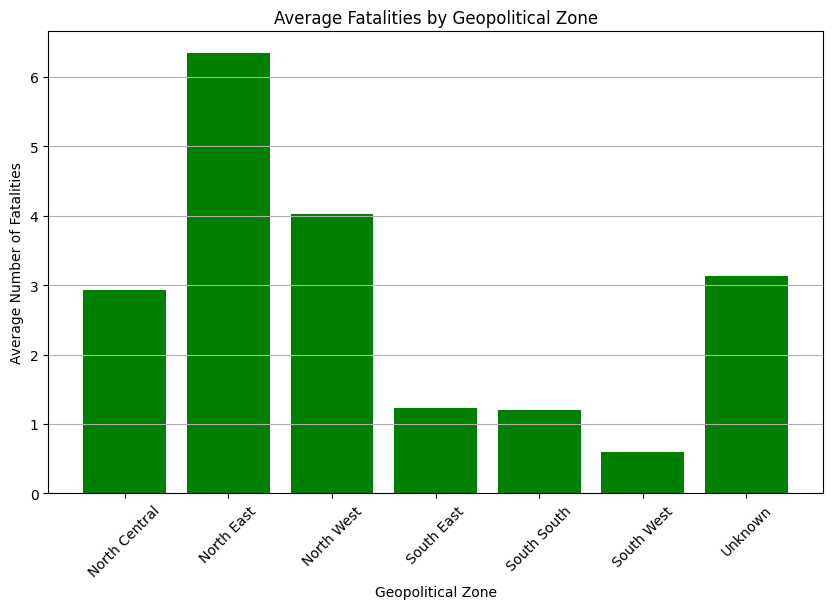

In [46]:
plt.figure(figsize=(10, 6))
plt.bar(average_fatalities['geopolitical_zone'], average_fatalities['fatalities'], color='green')
plt.title('Average Fatalities by Geopolitical Zone')
plt.xlabel('Geopolitical Zone')
plt.ylabel('Average Number of Fatalities')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

#### Calculating the average fatalities by States

In [47]:
average_fatalities = NigeriaCrimeData.groupby('admin1')['fatalities'].mean().reset_index()
average_fatalities

,admin1,fatalities
0,Abia,2.140684
1,Adamawa,5.560976
2,Akwa Ibom,1.218220
3,Anambra,1.078308
4,Bauchi,1.958637
5,Bayelsa,0.912776
6,Benue,3.746657
7,Borno,7.331612
8,Cross River,1.784483
9,Delta,1.744656


**Borno State is mostly affected in terms of fatalities**

#### Plotting fatalities by States

The horizontal bar chart depicting average fatalities by state provides a detailed view of how fatalities are distributed across different states in Nigeria


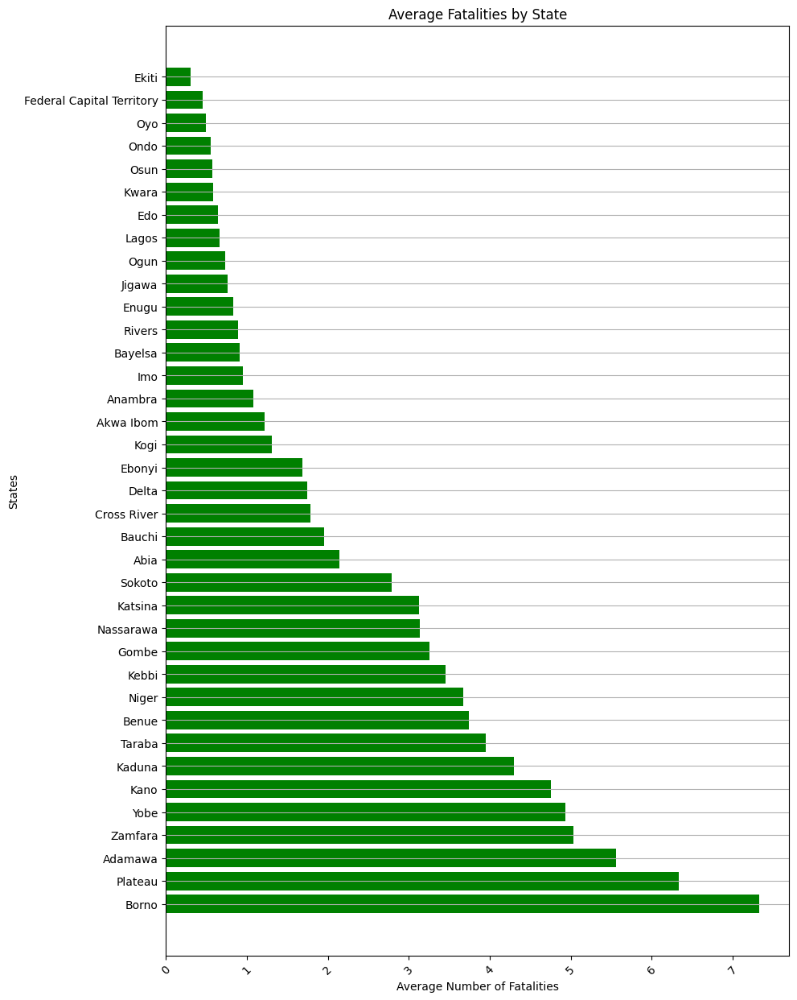

In [48]:
average_fatalities_sorted = average_fatalities.sort_values(by='fatalities', ascending=False)

plt.figure(figsize=(10, 15))
plt.barh(average_fatalities_sorted['admin1'], average_fatalities_sorted['fatalities'], color='green')
plt.title('Average Fatalities by State')
plt.xlabel('Average Number of Fatalities')
plt.ylabel('States')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

### Analyzing Sources of Crime Reports

**The media play a key role in crime dissemination. According to sources, **Vanguard (Nigeria)** has been the most consistent, followed by:**

1. Risk and Strategic Management Corporation
2. Daily Trust (Nigeria)
3. Nigeria Punch
4. Daily Post (Nigeria)
5. The Sun (Nigeria)
6. Daily Independence (Nigeria)
7. AFP
8. Sahara Reporters
9. All Africa

#### Counting occurrences of each source

In [49]:
source_counts = NigeriaCrimeData['source'].value_counts()
source_counts

source
Vanguard (Nigeria)                                                                                              3584
Risk and Strategic Management, Corporation                                                                      3482
Daily Trust (Nigeria)                                                                                           2915
Nigeria Punch                                                                                                   1835
Daily Post (Nigeria)                                                                                            1532
                                                                                                                ... 
Risk and Strategic Management, Corporation; Nigeria Punch; Nigeria Security Tracker; Sahara Reporters              1
Desert Herald; Guardian (Nigeria); New Telegraph; Nigeria Security Tracker; Nigerian Eye; Vanguard (Nigeria)       1
Daily Post (Nigeria); HumAngle; PR Nigeria; Sahara Report

#### Plotting the top 10 sources

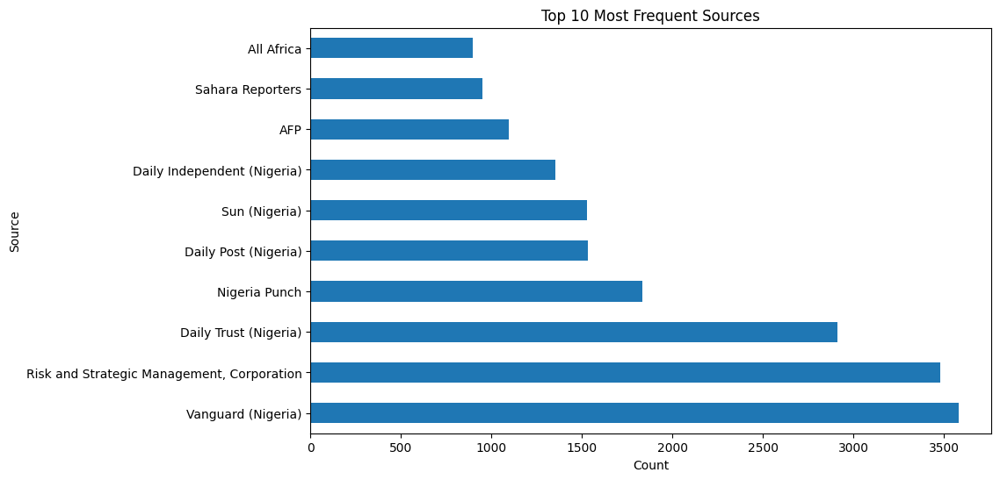

In [50]:
top_10_sources = source_counts.head(10)
top_10_sources.plot(kind='barh', figsize=(10,6))
plt.title('Top 10 Most Frequent Sources')
plt.xlabel('Count')
plt.ylabel('Source')
plt.show()


#### Creating a word cloud from the source column

In [51]:
wordcloud = WordCloud(width=800, height=400).generate_from_frequencies(source_counts)
wordcloud

#### Displaying the word cloud showing the sources

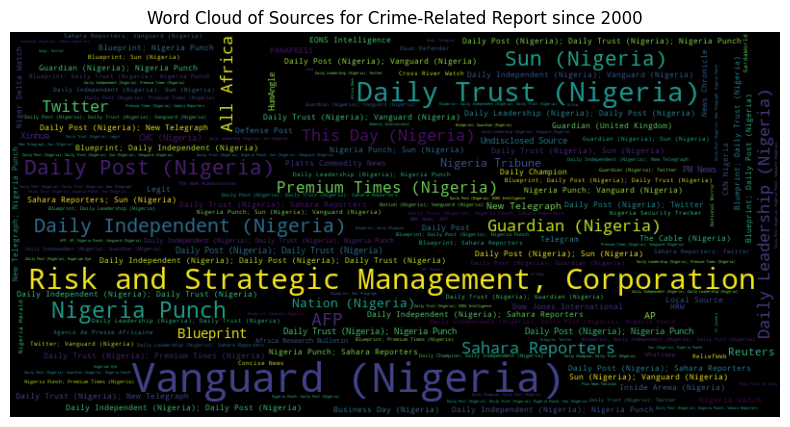

In [52]:
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Sources for Crime-Related Report since 2000')
plt.show()


### Analyzing Source Scale (Coverage Scope) of Crime Report

In [53]:
source_scale_counts = NigeriaCrimeData['source_scale'].value_counts()
source_scale_counts

source_scale
National                       24513
International                   3822
Local partner-International     3745
New media                       1057
National-Regional               1024
Regional                         669
Subnational                      592
New media-National               489
National-International           481
Other                            352
Local partner-Other              335
Subnational-National             277
Other-National                   123
Other-New media                   66
New media-Regional                30
Other-International               29
New media-International           15
Other-Subnational                 11
New media-Subnational             10
Subnational-Regional               7
Subnational-International          5
Other-Regional                     4
Regional-International             2
Name: count, dtype: int64

**The national news media has been the most consistent in reporting crime-related information across the country. It is far more higher than others**

#### Plotting the Frequency of the Source Scale (Coverage Scope)

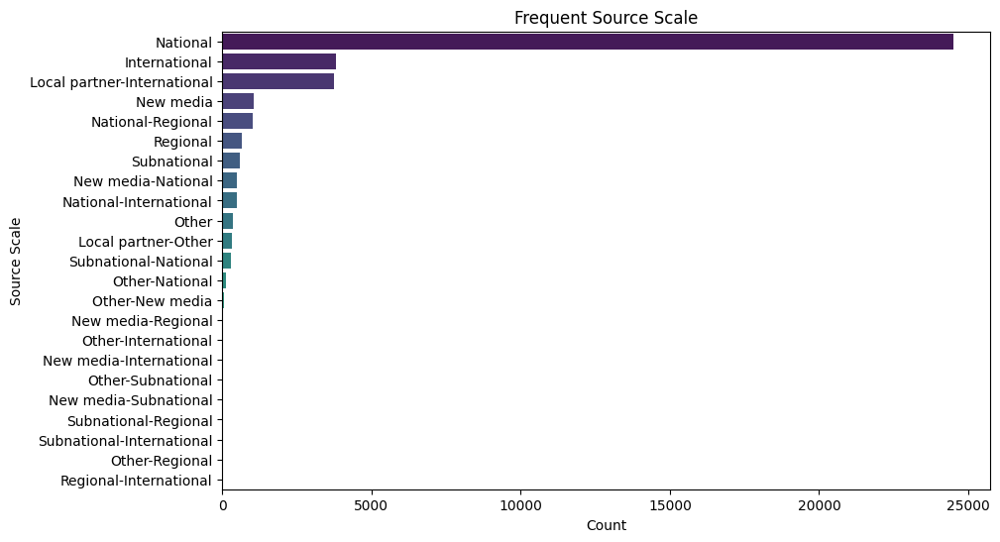

In [54]:
plt.figure(figsize=(10, 6))
sns.barplot(x=source_scale_counts.values, y=source_scale_counts.index, palette="viridis")
plt.title('Frequent Source Scale')
plt.xlabel('Count')
plt.ylabel('Source Scale')
plt.show()

### Analyzing Crime Actors in Nigeria

#### Counting occurrences of each actor

**The following are the most prominent actors of crime in Nigeria:**

Protesters 

Unidentified Armed Groups 

Rioters 

Military Forces of Nigeria (2015-2023)

Fulani Ethnic Militia (Nigeria)

In [55]:
actors_counts = NigeriaCrimeData['actor1'].value_counts()
actors_counts

actor1
Protesters (Nigeria)                      7632
Unidentified Armed Group (Nigeria)        6676
Rioters (Nigeria)                         3357
Military Forces of Nigeria (2015-2023)    2899
Fulani Ethnic Militia (Nigeria)           2148
                                          ... 
Ujoonda Ethnic Militia (Nigeria)             1
Tyo Mu Communal Militia (Nigeria)            1
Tongov Communal Militia (Nigeria)            1
Idi Arere Communal Militia (Nigeria)         1
Saro-Wiwa Militia                            1
Name: count, Length: 847, dtype: int64

#### Plotting the top 20 actors

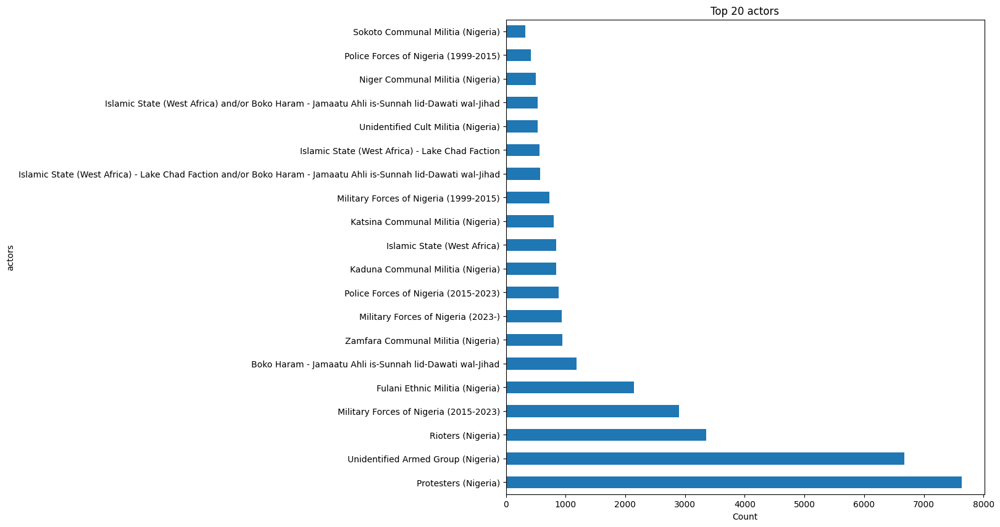

In [56]:
top_20_actors = actors_counts.head(20)
top_20_actors.plot(kind='barh', figsize=(10,10))
plt.title('Top 20 actors')
plt.xlabel('Count')
plt.ylabel('actors')
plt.show()

### Analyzing the Top 3 Geopolitical Zones with High Crime Rates



#### Filtering the dataset for North West, North East and North Central zones

In [57]:
NorthWEC = NigeriaCrimeData[NigeriaCrimeData['geopolitical_zone'].isin(['North West', 'North East', 'North Central'])]
NorthWEC

,event_date,year,disorder_type,event_type,sub_event_type,actor1,admin1,admin2,location,latitude,longitude,source,source_scale,fatalities,month,geopolitical_zone
event_id_cnty,,,,,,,,,,,,,,,,
NIG38682,2024-09-27,2024,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),Katsina,Kankara,Kankara,11.9302,7.4127,Twitter,New media,10,September,North West
NIG38645,2024-09-26,2024,Political violence,Violence against civilians,Abduction/forced disappearance,Katsina Communal Militia (Nigeria),Katsina,Jibia,Jibia,13.0978,7.2225,Daily Independent (Nigeria); Daily Leadership ...,National,0,September,North West
NIG38667,2024-09-25,2024,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,Borno,Marte,Marte,12.3611,13.8246,Whatsapp,New media,1,September,North East
NIG38684,2024-09-24,2024,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),Zamfara,Maru,Dan Sadau,11.2962,6.4952,Daily Post (Nigeria); Daily Trust (Nigeria); I...,National,16,September,North West
NIG38694,2024-09-24,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Borno,Maiduguri Metro,Maiduguri,11.8312,13.1517,Whatsapp,New media,0,September,North East
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NIG531,2000-02-21,2000,Political violence,Battles,Armed clash,Muslim Militia (Nigeria),Kaduna,Kaduna North,Kaduna,10.5222,7.4383,Dow Jones International,International,300,February,North West
NIG528,2000-02-15,2000,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Kaduna,Kaduna North,Kaduna,10.5222,7.4383,AFP,International,0,February,North West
NIG526,2000-01-30,2000,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Borno,Hawul,Golam,10.3408,12.3123,PM News,National,0,January,North East


#### Counting the number of crimes per zone

**The Northern part of the country is undoubtedly the most affected by crime and violence. The North East region has the highest crime rates, followed by the North West and North Central regions**

In [58]:
crime_rate_by_zone = NorthWEC.groupby('geopolitical_zone').size()
crime_rate_by_zone

geopolitical_zone
North Central    6692
North East       8288
North West       6842
dtype: int64



#### Plotting the Frequency of Crimes in Geopolitical Zones



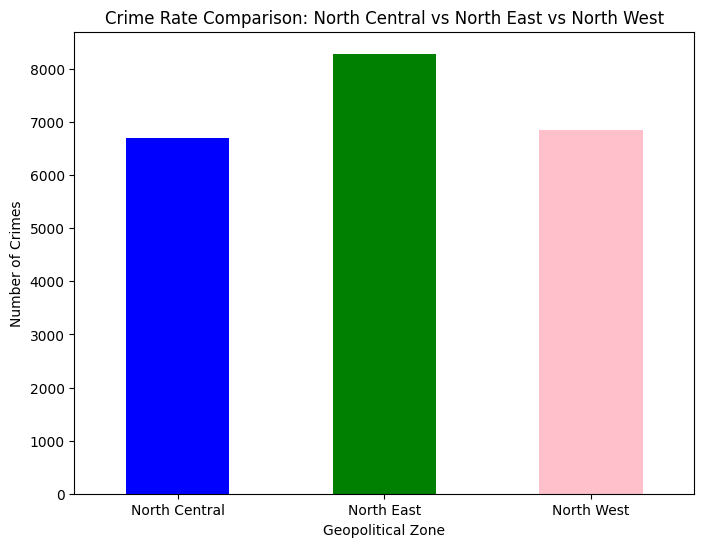

In [59]:
plt.figure(figsize=(8, 6))
crime_rate_by_zone.plot(kind='bar', color=['blue', 'green', 'pink'])

plt.title('Crime Rate Comparison: North Central vs North East vs North West')
plt.xlabel('Geopolitical Zone')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=0)
plt.show()


#### Plotting the occurrences of each crime type in the three zones

**Battles and explosions/remote violence are most prevalent in the Northeast, while violence against civilians is most common in the Northwest. Protests and riots are primarily concentrated in the North Central region.**


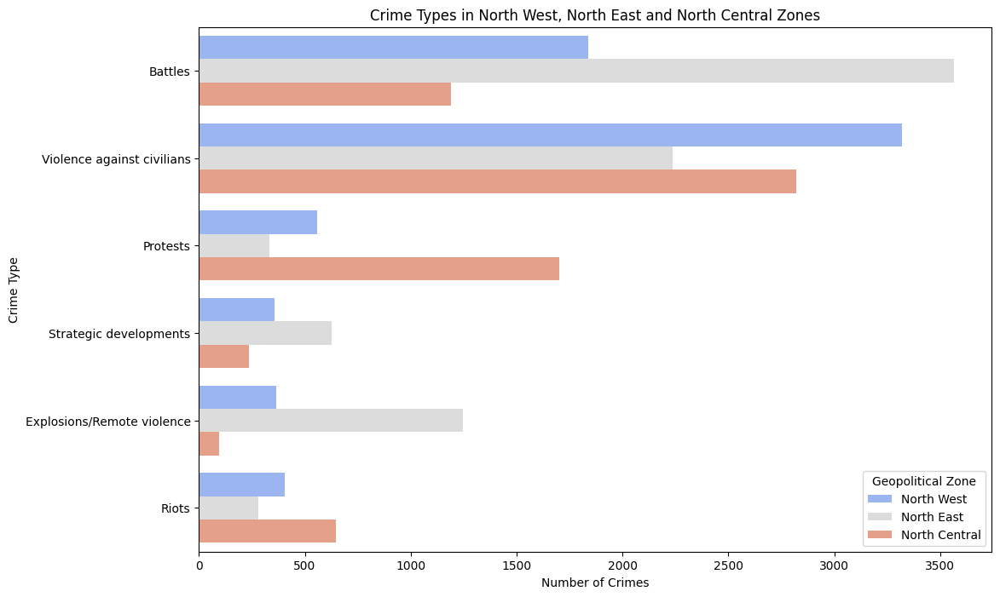

In [60]:
plt.figure(figsize=(12, 8))
sns.countplot(data=NorthWEC, y='event_type', hue='geopolitical_zone', palette='coolwarm')

plt.title('Crime Types in North West, North East and North Central Zones')
plt.xlabel('Number of Crimes')
plt.ylabel('Crime Type')
plt.legend(title='Geopolitical Zone')
plt.show()

#### Grouping by geopolitical zone and calculate total fatalities

In [61]:
fatalities_by_zone = NorthWEC.groupby('geopolitical_zone')['fatalities'].sum()
fatalities_by_zone

geopolitical_zone
North Central    19569
North East       52535
North West       27551
Name: fatalities, dtype: int64

#### Fatalities Distribution in Northern Geopolitical Zones

**The North East region not only has the highest crime rates but also the highest number of fatalities, followed by the North West and North Central regions**

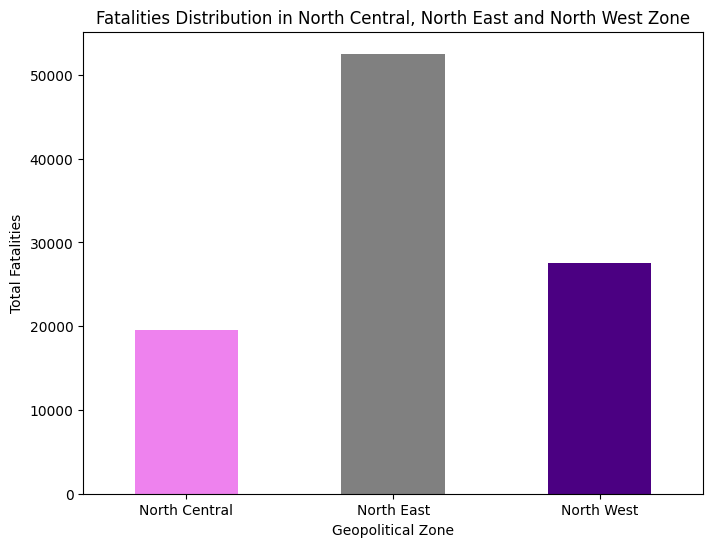

In [62]:
plt.figure(figsize=(8, 6))
fatalities_by_zone.plot(kind='bar', color=['violet', 'grey', 'indigo'])

plt.title('Fatalities Distribution in North Central, North East and North West Zone')
plt.xlabel('Geopolitical Zone')
plt.ylabel('Total Fatalities')
plt.xticks(rotation=0)
plt.show()


#### Grouping by year and geopolitical zone to get the count of crimes per year

In [63]:
crime_trend_year = NorthWEC.groupby(['year', 'geopolitical_zone']).size().unstack()
crime_trend_year

geopolitical_zone,North Central,North East,North West
year,,,
2000,10,10,29
2001,27,24,10
2002,34,13,15
2003,24,23,15
2004,69,26,25
2005,23,7,21
2006,8,11,4
2007,7,15,17
2008,13,14,8


#### Line Graph of Yearly Crime Incidents in Northern Regions

**The northern regions of Nigeria, particularly the North East, continue to bear the brunt of crime and violence, with the highest crime rates and fatalities in the country. The North West and North Central regions also experience significant levels of unrest. The analysis of yearly crime trends shows a persistent rise in criminal activities across these zones, indicating a complex security situation that remains a challenge for authorities**

<Figure size 1000x600 with 0 Axes>

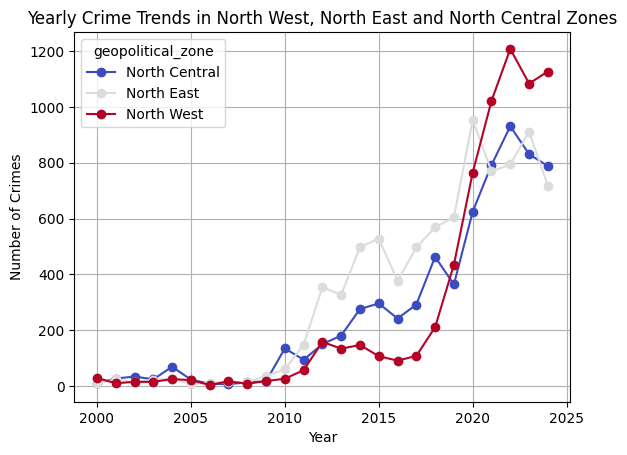

In [64]:
plt.figure(figsize=(10, 6))
crime_trend_year.plot(kind='line', marker='o', colormap='coolwarm')

plt.title('Yearly Crime Trends in North West, North East and North Central Zones')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.grid(True)
plt.show()


#### Monthly Breakdown of Crimes in Northern Zones

In [65]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

NorthWEC['month'] = pd.Categorical(NorthWEC['month'], categories=month_order, ordered=True)

#### Calculating crime counts by month

In [66]:
crime_counts = NorthWEC['month'].value_counts().sort_index()
crime_counts

month
January      2025
February     1932
March        2011
April        1949
May          1905
June         1851
July         1873
August       1840
September    1621
October      1576
November     1562
December     1677
Name: count, dtype: int64

#### Monthly Crime Trends in North West, North East, and North Central Zones

The monthly crime trends in the North West, North East, and North Central regions of Nigeria reveal significant fluctuations in criminal activities over time. The data indicates that certain months experience spikes in crime rates, reflecting the complex socio-political landscape and varying factors that contribute to unrest in these regions. A closer look at the trend reveals that crime tends to occur most frequently at the beginning of the year, as the overall pattern indicates a downward movement thereafter.


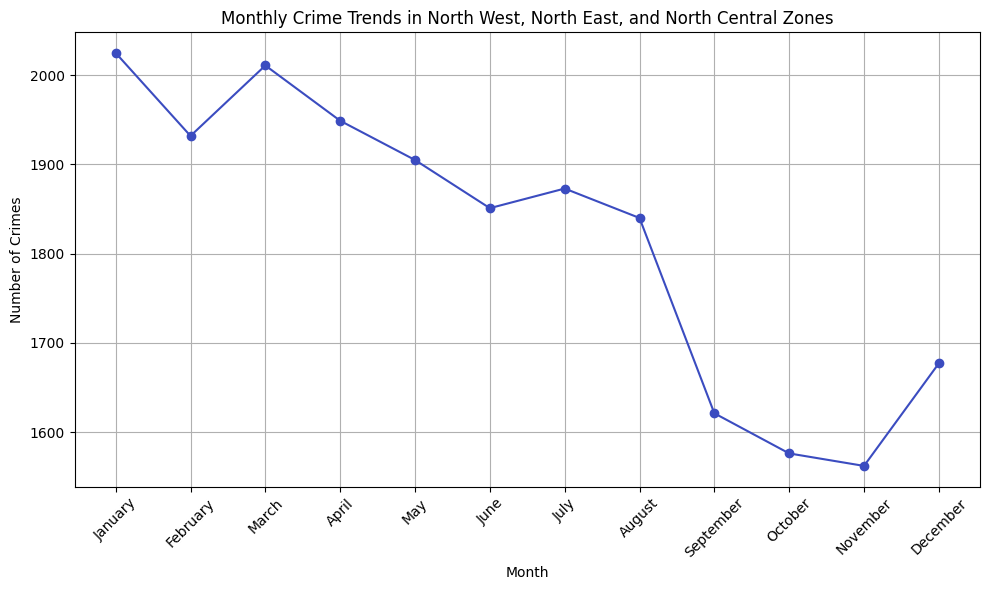

In [67]:
plt.figure(figsize=(10, 6))

ax = crime_counts.plot(kind='line', marker='o', colormap='coolwarm', figsize=(10, 6))

ax.set_xticks(range(len(month_order)))  
ax.set_xticklabels(month_order, rotation=45)  

plt.title('Monthly Crime Trends in North West, North East, and North Central Zones')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.grid(True)
plt.tight_layout()  
plt.show()


### Analyzing North East Geopolitical zone

#### Filtering the dataset for North East

In [68]:
NorthE = NigeriaCrimeData[NigeriaCrimeData['geopolitical_zone'].isin(['North East'])]
NorthE

,event_date,year,disorder_type,event_type,sub_event_type,actor1,admin1,admin2,location,latitude,longitude,source,source_scale,fatalities,month,geopolitical_zone
event_id_cnty,,,,,,,,,,,,,,,,
NIG38667,2024-09-25,2024,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,Borno,Marte,Marte,12.3611,13.8246,Whatsapp,New media,1,September,North East
NIG38694,2024-09-24,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Borno,Maiduguri Metro,Maiduguri,11.8312,13.1517,Whatsapp,New media,0,September,North East
NIG38666,2024-09-23,2024,Political violence,Violence against civilians,Abduction/forced disappearance,Islamic State (West Africa) and/or Boko Haram ...,Borno,Gwoza,Uvaha,11.0167,13.6500,Blueprint; Daily Trust (Nigeria),National,0,September,North East
NIG38680,2024-09-23,2024,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),Yobe,Gujba,Gujba,11.5032,11.9367,Blueprint; Daily Trust (Nigeria),National,4,September,North East
NIG38681,2024-09-23,2024,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),Borno,Gwoza,Uvaha,11.0167,13.6500,Blueprint; Daily Trust (Nigeria),National,1,September,North East
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NIG577,2000-03-28,2000,Political violence,Battles,Armed clash,Muslim Militia (Nigeria),Borno,Damboa,Damboa,11.1560,12.7576,BBC News; AFP,International,8,March,North East
NIG574,2000-03-27,2000,Demonstrations,Riots,Violent demonstration,Rioters (Nigeria),Borno,Damboa,Damboa,11.1560,12.7576,AFP,International,0,March,North East
NIG575,2000-03-27,2000,Political violence,Riots,Mob violence,Rioters (Nigeria),Borno,Maiduguri Metro,Maiduguri,11.8312,13.1517,Guardian (United Kingdom),International,0,March,North East


#### Checking the unique values in the North East column

In [69]:
NorthE.nunique()

event_date           3597
year                   25
disorder_type           4
event_type              6
sub_event_type         24
actor1                143
admin1                  6
admin2                112
location             1102
latitude             1081
longitude            1078
source                887
source_scale           18
fatalities            104
month                  12
geopolitical_zone       1
dtype: int64

#### Counting the Occurrences of Crimes in Each State(admin1) 

**Borno is the most affected State in the most affected region**

In [70]:
state_counts = NorthE['admin1'].value_counts()
state_counts

admin1
Borno      5615
Taraba      748
Adamawa     697
Yobe        640
Bauchi      411
Gombe       177
Name: count, dtype: int64

#### Proportion of Crimes by State in the North East

The Pie Chart shows the distribution of Crimes in North East Geopolitical Zone

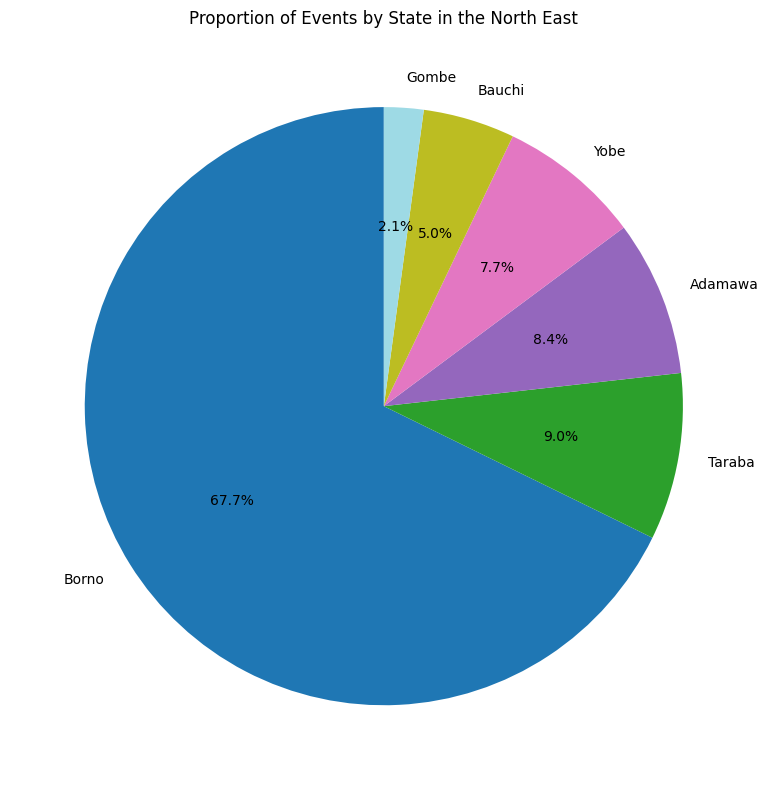

In [71]:
plt.figure(figsize=(8, 8))
state_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colormap='tab20')

plt.title('Proportion of Events by State in the North East')
plt.ylabel('') 
plt.tight_layout()
plt.show()


### Analyzing Borno State

#### Filtering the dataset for Borno State where Crime Rate is Highest

In [72]:
borno_data = NigeriaCrimeData[NigeriaCrimeData['admin1'] == 'Borno']
borno_data

,event_date,year,disorder_type,event_type,sub_event_type,actor1,admin1,admin2,location,latitude,longitude,source,source_scale,fatalities,month,geopolitical_zone
event_id_cnty,,,,,,,,,,,,,,,,
NIG38667,2024-09-25,2024,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,Borno,Marte,Marte,12.3611,13.8246,Whatsapp,New media,1,September,North East
NIG38694,2024-09-24,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Borno,Maiduguri Metro,Maiduguri,11.8312,13.1517,Whatsapp,New media,0,September,North East
NIG38666,2024-09-23,2024,Political violence,Violence against civilians,Abduction/forced disappearance,Islamic State (West Africa) and/or Boko Haram ...,Borno,Gwoza,Uvaha,11.0167,13.6500,Blueprint; Daily Trust (Nigeria),National,0,September,North East
NIG38681,2024-09-23,2024,Political violence,Battles,Armed clash,Military Forces of Nigeria (2023-),Borno,Gwoza,Uvaha,11.0167,13.6500,Blueprint; Daily Trust (Nigeria),National,1,September,North East
NIG38685,2024-09-23,2024,Political violence,Battles,Armed clash,MNJTF: Multinational Joint Task Force,Borno,Abadan,Malam Fatori,13.6746,13.3395,Daily Champion; Twitter,New media-National,23,September,North East
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NIG577,2000-03-28,2000,Political violence,Battles,Armed clash,Muslim Militia (Nigeria),Borno,Damboa,Damboa,11.1560,12.7576,BBC News; AFP,International,8,March,North East
NIG574,2000-03-27,2000,Demonstrations,Riots,Violent demonstration,Rioters (Nigeria),Borno,Damboa,Damboa,11.1560,12.7576,AFP,International,0,March,North East
NIG575,2000-03-27,2000,Political violence,Riots,Mob violence,Rioters (Nigeria),Borno,Maiduguri Metro,Maiduguri,11.8312,13.1517,Guardian (United Kingdom),International,0,March,North East


#### Plotting the occurrences of each crime type in Borno

This count plot effectively illustrates the distribution of different crime types in Borno, with battles and violence against civilians dominating

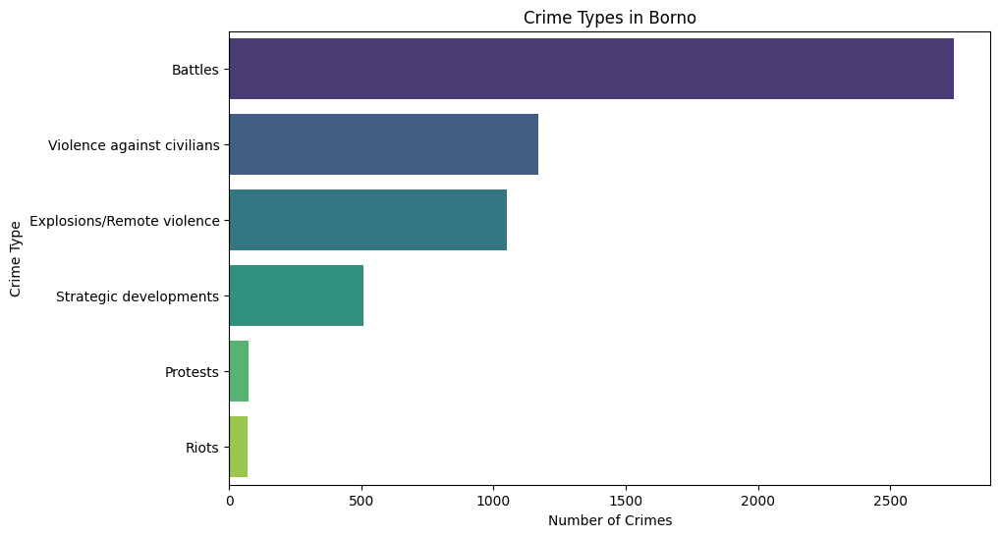

In [73]:
plt.figure(figsize=(10, 6))
sns.countplot(data=borno_data, y='event_type', order=borno_data['event_type'].value_counts().index, palette='viridis')
plt.title('Crime Types in Borno')
plt.xlabel('Number of Crimes')
plt.ylabel('Crime Type')
plt.show()

#### Grouping by year and calculating total fatalities in Borno

**The highest fatalities in Borno occurred in 2015, among the years 2000 to 2024**

In [74]:
borno_fatalities_year = borno_data.groupby('year')['fatalities'].sum()
borno_fatalities_year

year
2000      34
2001      50
2002      40
2003       3
2004      45
2005       0
2006      24
2007      17
2008       7
2009     818
2010      41
2011     314
2012     737
2013    2386
2014    5655
2015    7615
2016    2603
2017    2761
2018    2172
2019    2279
2020    3312
2021    2936
2022    2891
2023    2831
2024    1596
Name: fatalities, dtype: int64

#### Trends in Fatalities in Borno Over Time

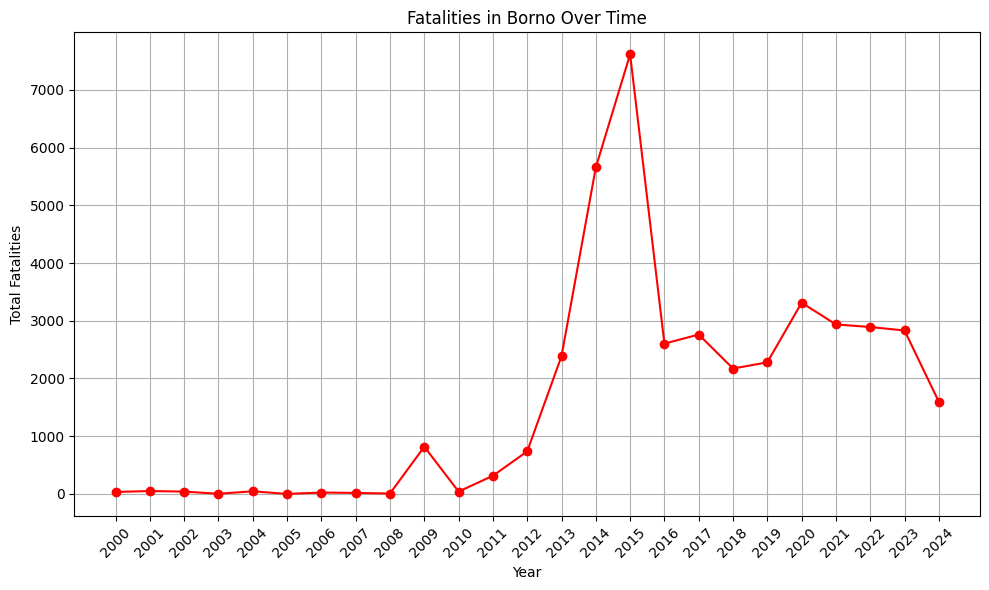

In [75]:
plt.figure(figsize=(10, 6))
borno_fatalities_year.plot(kind='line', marker='o', color='red')

plt.title('Fatalities in Borno Over Time')
plt.xlabel('Year')
plt.ylabel('Total Fatalities')
plt.xticks(borno_fatalities_year.index, rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)

plt.tight_layout()
plt.show()


#### Monthly Distribution of Crimes in Borno

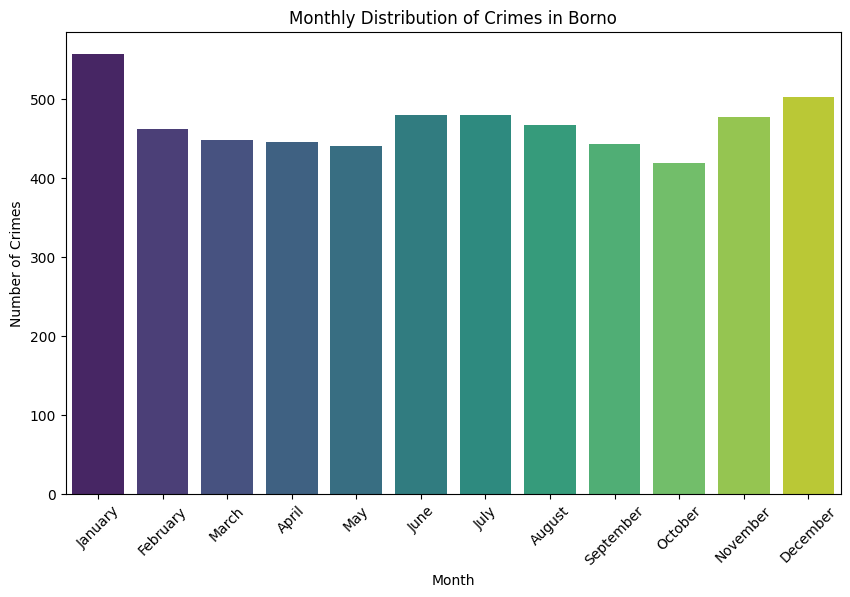

In [76]:
plt.figure(figsize=(10, 6))
sns.countplot(data=borno_data, x='month', palette='viridis')

plt.title('Monthly Distribution of Crimes in Borno')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.show()


#### Grouping by year and counting the number of crimes in borno

In [77]:
borno_crimes_year = borno_data.groupby('year').size()
borno_crimes_year

year
2000      9
2001     15
2002      6
2003      6
2004     11
2005      2
2006      8
2007     13
2008      4
2009     16
2010     29
2011    105
2012    192
2013    234
2014    270
2015    336
2016    290
2017    376
2018    382
2019    397
2020    724
2021    531
2022    542
2023    636
2024    481
dtype: int64

#### Trends in Crime Numbers in Borno Over the Years

**This bar chart effectively shows the trend in the number of crimes in Borno over the years. There is an increase in criminal activities over the years since 2000. 2020 has the highest surge from the chart below**

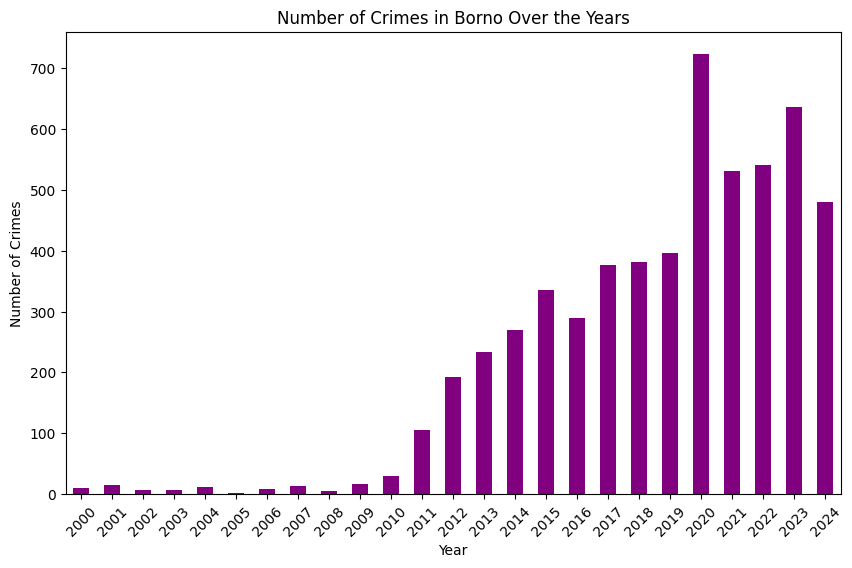

In [78]:
plt.figure(figsize=(10, 6))
borno_crimes_year.plot(kind='bar', color='purple')

plt.title('Number of Crimes in Borno Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.show()


#### Filter the dataset for 'Violence Against Civilians'

In [79]:
violence_data1 = NigeriaCrimeData[NigeriaCrimeData['event_type'] == 'Violence against civilians']
violence_data1

,event_date,year,disorder_type,event_type,sub_event_type,actor1,admin1,admin2,location,latitude,longitude,source,source_scale,fatalities,month,geopolitical_zone
event_id_cnty,,,,,,,,,,,,,,,,
NIG38645,2024-09-26,2024,Political violence,Violence against civilians,Abduction/forced disappearance,Katsina Communal Militia (Nigeria),Katsina,Jibia,Jibia,13.0978,7.2225,Daily Independent (Nigeria); Daily Leadership ...,National,0,September,North West
NIG38667,2024-09-25,2024,Political violence,Violence against civilians,Attack,Islamic State (West Africa) and/or Boko Haram ...,Borno,Marte,Marte,12.3611,13.8246,Whatsapp,New media,1,September,North East
NIG38666,2024-09-23,2024,Political violence,Violence against civilians,Abduction/forced disappearance,Islamic State (West Africa) and/or Boko Haram ...,Borno,Gwoza,Uvaha,11.0167,13.6500,Blueprint; Daily Trust (Nigeria),National,0,September,North East
NIG38678,2024-09-22,2024,Political violence,Violence against civilians,Attack,Military Forces of Nigeria (2023-),Katsina,Katsina,Katsina,12.9894,7.6006,Sahara Reporters,Regional,0,September,North West
NIG38712,2024-09-22,2024,Political violence,Violence against civilians,Attack,Unidentified Armed Group (Nigeria),Federal Capital Territory,Abuja Municipal,Mpape,9.1458,7.4956,Daily Trust (Nigeria); Sahara Reporters,National-Regional,1,September,North Central
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NIG573,2000-03-26,2000,Political violence,Violence against civilians,Attack,Unidentified Armed Group (Nigeria),Bayelsa,Sagbama,Niger Delta,4.8966,6.0744,Reuters,International,0,March,South South
NIG571,2000-03-20,2000,Political violence,Violence against civilians,Attack,Police Forces of Nigeria (1999-2015),Kaduna,Kaduna North,Kaduna,10.5222,7.4383,Reuters,International,4,March,North West
NIG545,2000-02-29,2000,Political violence,Violence against civilians,Attack,Christian Militia (Nigeria),Akwa Ibom,Uyo,Uyo,5.0333,7.9266,All Africa,International,0,February,South South


#### States Most Affected by Violence Against Civilians

**Kaduna has emerged as the most affected state by violence against civilians based on the analysis. Located in the North-West region of Nigeria, Kaduna has been a hotspot for various forms of violence, including banditry, armed clashes, kidnappings, and communal conflicts. The state's complex socio-political landscape, coupled with ethno-religious tensions, has exacerbated the security situation.**

Key contributing factors include:

Banditry and Armed Groups: The rise of armed groups and bandits in rural areas has led to frequent attacks on villages, resulting in mass casualties and displacements.

Ethno-Religious Conflicts: Kaduna has a history of ethno-religious tensions, which have often escalated into violent confrontations.

Kidnapping for Ransom: The state has seen an increase in kidnappings, with both civilians and travelers frequently targeted.

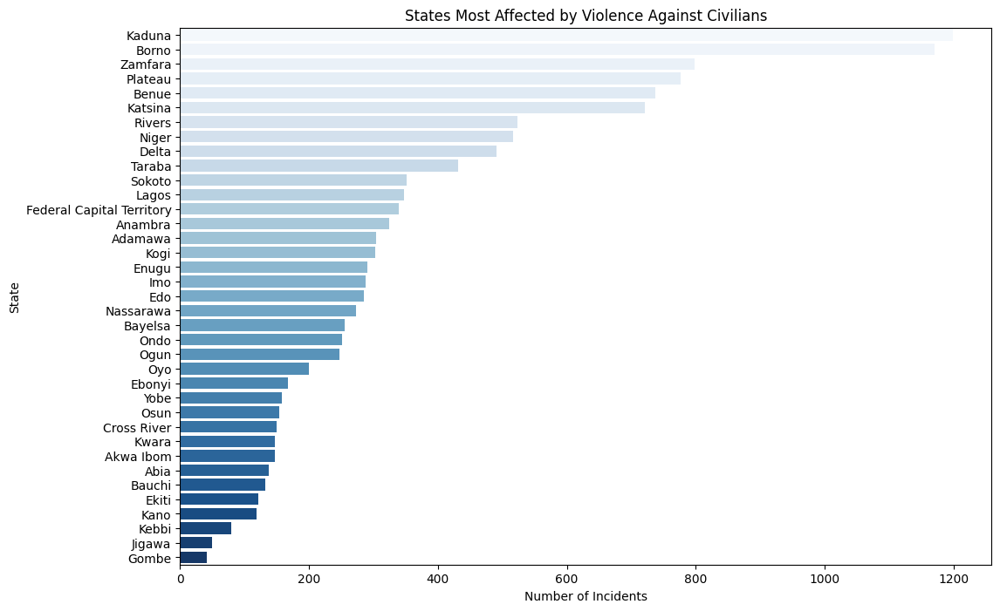

In [80]:
plt.figure(figsize=(12, 8))
sns.countplot(data=violence_data1, y='admin1', order=violence_data1['admin1'].value_counts().index, palette='Blues')

plt.title('States Most Affected by Violence Against Civilians')
plt.xlabel('Number of Incidents')
plt.ylabel('State')
plt.show()

#### Grouping by state and summing the fatalities for "Violence Against Civilians" incidents

In [81]:
violence_fatalities1 = violence_data1.groupby('admin1')['fatalities'].sum().sort_values(ascending=False)
violence_fatalities1

admin1
Borno                        10550
Plateau                       5383
Kaduna                        5002
Benue                         3806
Zamfara                       3084
Taraba                        1891
Katsina                       1749
Adamawa                       1447
Kano                          1235
Niger                         1183
Sokoto                        1028
Nassarawa                      856
Yobe                           770
Delta                          661
Rivers                         661
Anambra                        584
Kogi                           456
Lagos                          382
Imo                            378
Abia                           364
Ebonyi                         354
Enugu                          349
Ogun                           287
Bauchi                         279
Akwa Ibom                      254
Kebbi                          241
Edo                            233
Cross River                    209
Bayelsa      

**Borno has the highest fatalities from Violence against civilians**

#### Fatalities Distribution from Violence Against Civilians by State 

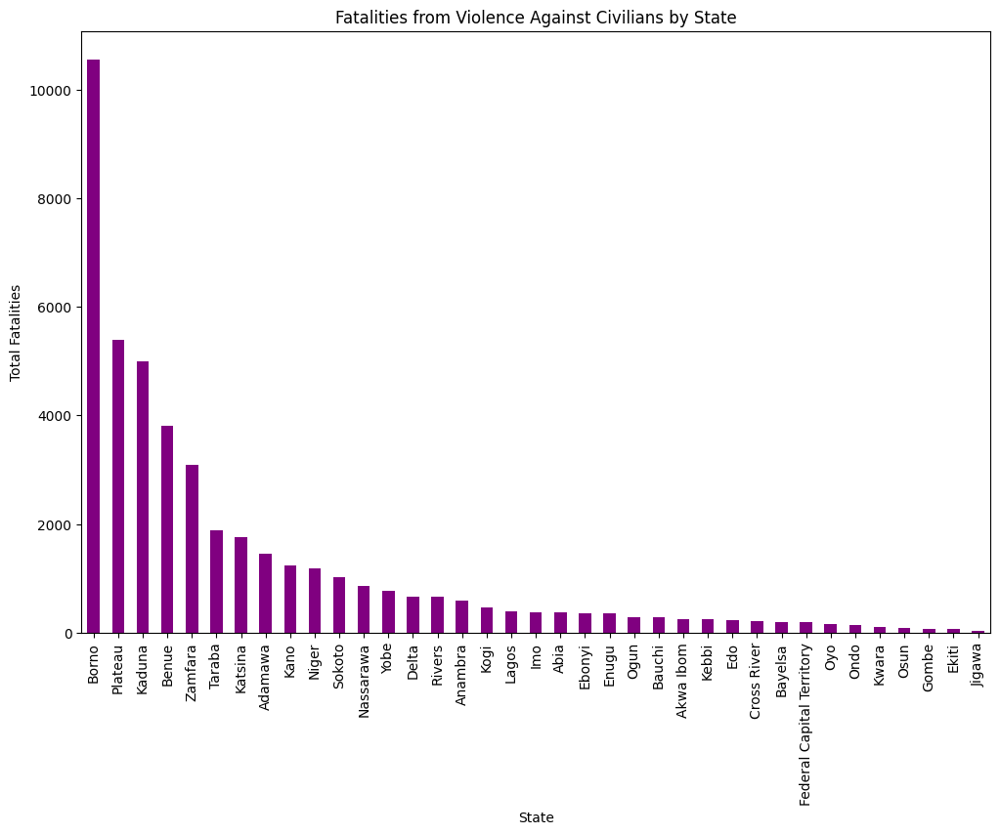

In [82]:
plt.figure(figsize=(12, 8))
violence_fatalities1.plot(kind='bar', color='purple')

plt.title('Fatalities from Violence Against Civilians by State')
plt.xlabel('State')
plt.ylabel('Total Fatalities')
plt.xticks(rotation=90)
plt.show()

#### Filter the dataset for 'Protests'

In [83]:
violence_data2 = NigeriaCrimeData[NigeriaCrimeData['event_type'] == 'Protests']
violence_data2

,event_date,year,disorder_type,event_type,sub_event_type,actor1,admin1,admin2,location,latitude,longitude,source,source_scale,fatalities,month,geopolitical_zone
event_id_cnty,,,,,,,,,,,,,,,,
NIG38646,2024-09-27,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Enugu,Enugu North,Enugu,6.4426,7.5022,Guardian (Nigeria),National,0,September,South East
NIG38690,2024-09-25,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Edo,Oredo,Benin City,6.3351,5.6275,Vanguard (Nigeria),National,0,September,South South
NIG38691,2024-09-25,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Osun,Osogbo,Oshogbo,7.7667,4.5667,Daily Champion,National,0,September,South West
NIG38702,2024-09-25,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Lagos,Alimosho,Ipaja,6.6088,3.2545,Daily Trust (Nigeria); Vanguard (Nigeria),National,0,September,South West
NIG38694,2024-09-24,2024,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Borno,Maiduguri Metro,Maiduguri,11.8312,13.1517,Whatsapp,New media,0,September,North East
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NIG665,2000-10-11,2000,Political violence; Demonstrations,Protests,Excessive force against protesters,Police Forces of Nigeria (1999-2015),Lagos,Lagos Island,Lagos,6.4531,3.3958,Reuters,International,1,October,South West
NIG570,2000-03-20,2000,Political violence; Demonstrations,Protests,Excessive force against protesters,Police Forces of Nigeria (1999-2015),Kaduna,Kaduna North,Kaduna,10.5222,7.4383,AFP; BBC News,International,2,March,North West
NIG530,2000-02-21,2000,Demonstrations,Protests,Peaceful protest,Protesters (Nigeria),Kaduna,Kaduna North,Kaduna,10.5222,7.4383,AFP,International,0,February,North West


#### Plotting the number of protests by state

**Conclusion on Why Abuja and Lagos Have the Most Protests:**

From the bar chart visualization, Abuja and Lagos emerge as the states with the highest number of protest incidents. This trend is driven by several factors unique to these cities:

Abuja - The Political Epicenter:

As Nigeria’s capital city and the center of governmental authority, Abuja naturally becomes a key location for protests, particularly those directed at the federal government. Citizens and interest groups from across the country often target Abuja to make their grievances heard on a national level. The frequency of protests is linked to the city's role as the home of key governmental institutions, where political and policy decisions are made.
Protests related to governance, political reform, and social justice frequently take place in Abuja, given the proximity to the country’s leadership.

Lagos - The Economic Powerhouse:

Lagos, being Nigeria’s largest and most populous city, serves as the country’s economic hub. This makes it a natural center for protests, particularly related to economic challenges, labor disputes, and social inequality. Protests in Lagos are often fueled by discontent over unemployment, inflation, infrastructure issues, and rising living costs.
The city’s significance as the commercial center of Nigeria means that any economic policies or reforms that negatively affect the masses tend to spark demonstrations, as seen during movements like #EndSARS and labor union strikes.


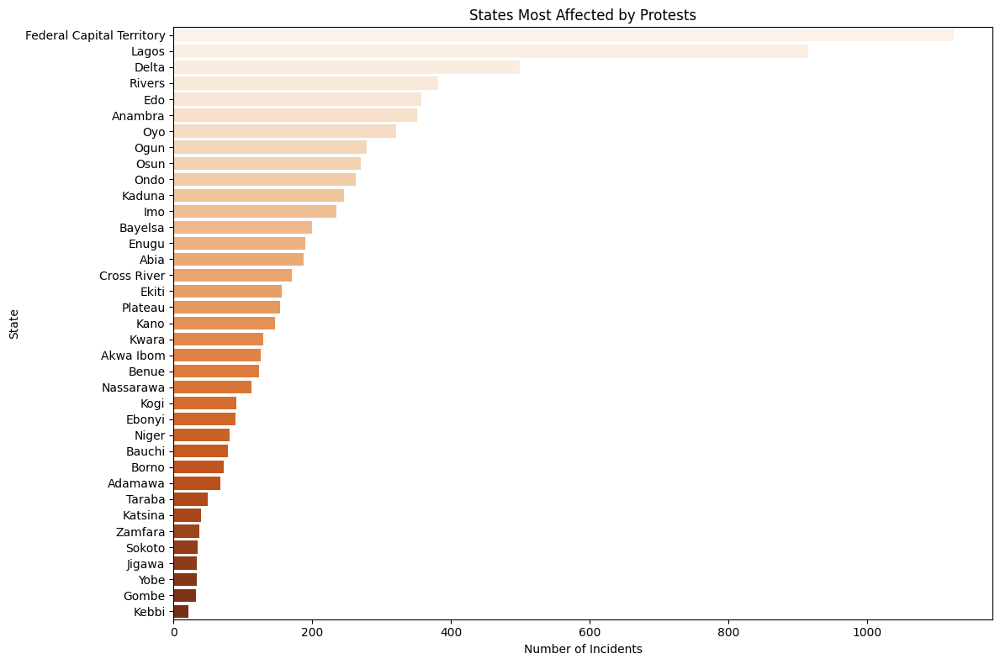

In [84]:
plt.figure(figsize=(12, 8))
sns.countplot(data=violence_data2, y='admin1', order=violence_data2['admin1'].value_counts().index, palette='Oranges')

plt.title('States Most Affected by Protests')
plt.xlabel('Number of Incidents')
plt.ylabel('State')
plt.tight_layout()  
plt.show()

#### Grouping by state and summing the fatalities for "Protest" incidents

In [85]:
violence_fatalities2 = violence_data2.groupby('admin1')['fatalities'].sum().sort_values(ascending=False)
violence_fatalities2

admin1
Lagos                        36
Abia                         22
Kaduna                       20
Rivers                       16
Federal Capital Territory    13
Nassarawa                    10
Delta                         8
Edo                           8
Ogun                          8
Plateau                       7
Adamawa                       6
Oyo                           5
Kwara                         4
Yobe                          4
Kogi                          4
Anambra                       3
Bauchi                        3
Cross River                   3
Kebbi                         3
Akwa Ibom                     2
Imo                           2
Kano                          2
Ekiti                         2
Ondo                          1
Osun                          1
Sokoto                        1
Zamfara                       1
Jigawa                        1
Gombe                         1
Enugu                         1
Niger                         0
E

#### Fatalities from Protests by State 

**Lagos has the highest fatalities during Protest**

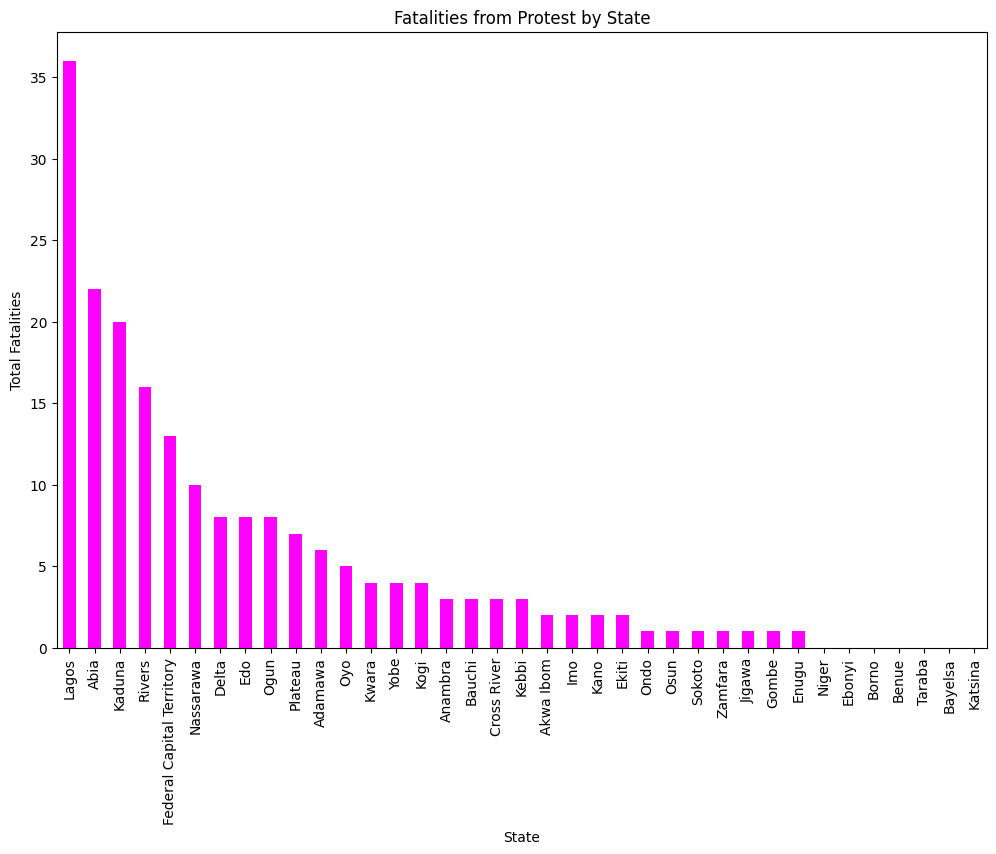

In [86]:
plt.figure(figsize=(12, 8))
violence_fatalities2.plot(kind='bar', color='magenta')

plt.title('Fatalities from Protest by State')
plt.xlabel('State')
plt.ylabel('Total Fatalities')
plt.xticks(rotation=90)
plt.show()

#### Counting occurrences of each actor in North East

In [87]:
actors_counts = NorthE['actor1'].value_counts()
actors_counts

actor1
Military Forces of Nigeria (2015-2023)                                                                             1683
Boko Haram - Jamaatu Ahli is-Sunnah lid-Dawati wal-Jihad                                                           1054
Islamic State (West Africa)                                                                                         822
Unidentified Armed Group (Nigeria)                                                                                  704
Islamic State (West Africa) - Lake Chad Faction and/or Boko Haram - Jamaatu Ahli is-Sunnah lid-Dawati wal-Jihad     556
                                                                                                                   ... 
Shome Ethnic Militia (Nigeria)                                                                                        1
Dobeli Communal Militia (Nigeria)                                                                                     1
Tangalere Communal Militia (Niger

#### Plotting the top 10 Actors in North East

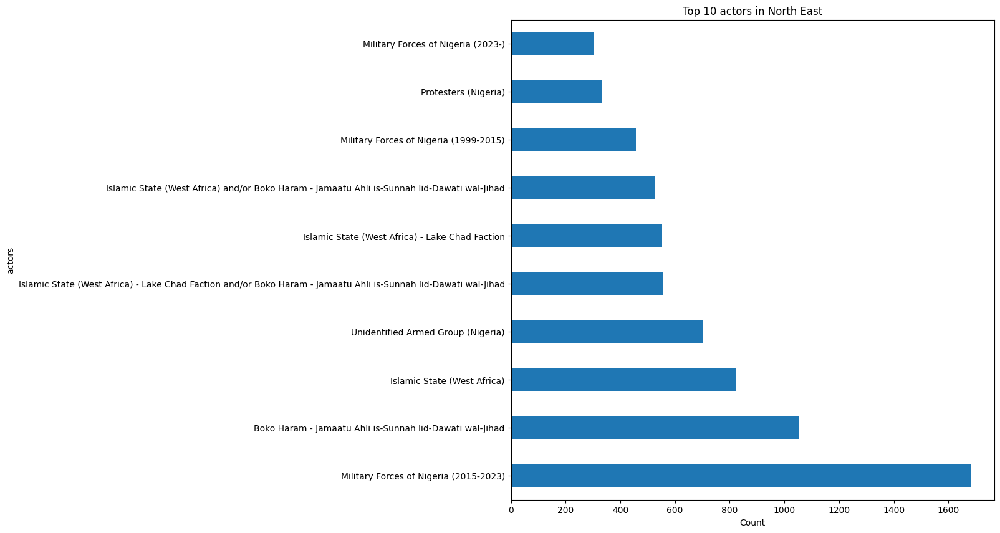

In [88]:
top_10_actors = actors_counts.head(10)
top_10_actors.plot(kind='barh', figsize=(10,10))
plt.title('Top 10 actors in North East')
plt.xlabel('Count')
plt.ylabel('actors')
plt.show()

### Chi-Square test

#### Function to perform Chi-Square test between two columns

In [89]:
def chi_square_test(cat1, cat2):
    contingency_table = pd.crosstab(NigeriaCrimeData[cat1], NigeriaCrimeData[cat2])
    
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    print(f"Chi-Square Test between {cat1} and {cat2}")
    print(f"Chi2 Statistic: {chi2}")
    print(f"p-value: {p}")
    print(f"Degrees of Freedom: {dof}")
    print(f"Expected Frequencies: \n{expected}\n")
    
    if p < 0.05:
        print(f"There is a significant association between {cat1} and {cat2}.")
    else:
        print(f"There is no significant association between {cat1} and {cat2}.\n")

#### Test between Crime Type and State

In [90]:
chi_square_test('event_type', 'admin1')

Chi-Square Test between event_type and admin1
Chi2 Statistic: 13599.119708886003
p-value: 0.0
Degrees of Freedom: 180
Expected Frequencies: 
[[ 137.19188486  181.79228849  123.10754687  289.77221308  107.19746136
   212.30835413  351.06516544 1464.51032981  151.27622285  439.22268841
   123.10754687  251.43151522  106.41499814  187.53035212  488.25705029
    46.16533008  239.17292474   45.904509    632.23028307  137.45270593
   351.32598651   46.68697222  158.84003399  112.15306177  523.46789527
   150.49375963  273.6013065   219.6113442   189.61692071  187.79117319
   202.39715333  361.49800839  396.44803229  156.49264433  195.09416326
   166.92548728  414.44468639]
 [  26.55281746   35.18500717   23.82686282   56.08399278   20.74754368
    41.09124223   67.94694354  283.44880238   29.27877211   85.00940039
    23.82686282   48.66333847   20.59610176   36.29558128   94.49976101
     8.93507356   46.29074831    8.88459292  122.36507515   26.6032981
    67.99742419    9.03603484   30.74

#### Test between Crime Type and Geopolitical Zone

In [91]:
chi_square_test('event_type', 'geopolitical_zone')

Chi-Square Test between event_type and geopolitical_zone
Chi2 Statistic: 8631.47813944379
p-value: 0.0
Degrees of Freedom: 30
Expected Frequencies: 
[[1745.41462637 2161.68506028 1784.53778746  976.77492166 1573.79435976
  1429.29948484  150.49375963]
 [ 337.81645334  418.38355728  345.38854958  189.05000266  304.60019119
   276.63391577   29.12733018]
 [1367.97004621 1694.22231664 1398.63285358  765.54809071 1233.4625312
  1120.21456264  117.94959902]
 [ 604.19565564  748.29252748  617.73859472  338.12204578  544.78729619
   494.76870784   52.09517234]
 [ 320.93451591  397.47538372  328.12820649  179.60247491  289.37819321
   262.80949599   27.67172978]
 [2315.66870253 2867.9411546  2367.57400818 1295.90246428 2087.97742843
  1896.27383292  199.66240905]]

There is a significant association between event_type and geopolitical_zone.


#### Test between Specific Crime Type and State

In [92]:
chi_square_test('sub_event_type', 'admin1')

Chi-Square Test between sub_event_type and admin1
Chi2 Statistic: 17583.534699797718
p-value: 0.0
Degrees of Freedom: 828
Expected Frequencies: 
[[4.00596952e+01 5.30829040e+01 3.59471029e+01 8.46127782e+01
  3.13013968e+01 6.19935206e+01 1.02510170e+02 4.27633438e+02
  4.41722874e+01 1.28251952e+02 3.59471029e+01 7.34173881e+01
  3.10729194e+01 5.47584046e+01 1.42569866e+02 1.34801636e+01
  6.98379096e+01 1.34040045e+01 1.84609698e+02 4.01358543e+01
  1.02586330e+02 1.36324818e+01 4.63809018e+01 3.27484200e+01
  1.52851346e+02 4.39438101e+01 7.98909130e+01 6.41259759e+01
  5.53676775e+01 5.48345637e+01 5.90994742e+01 1.05556535e+02
  1.15761857e+02 4.56954698e+01 5.69670190e+01 4.87418344e+01
  1.21016836e+02]
 [2.02533326e+00 2.68375910e+00 1.81740932e+00 4.27784269e+00
  1.58253226e+00 3.13426098e+00 5.18269690e+00 2.16202401e+01
  2.23325721e+00 6.48414679e+00 1.81740932e+00 3.71182750e+00
  1.57098093e+00 2.76846885e+00 7.20803017e+00 6.81528493e-01
  3.53085666e+00 6.77678050e-01

#### Test between Specific Crime Type and Geopolitical Zone

In [93]:
chi_square_test('sub_event_type', 'geopolitical_zone')

Chi-Square Test between sub_event_type and geopolitical_zone
Chi2 Statistic: 10553.149913629655
p-value: 0.0
Degrees of Freedom: 138
Expected Frequencies: 
[[5.09656806e+02 6.31206756e+02 5.21080673e+02 2.85215890e+02
  4.59544107e+02 4.17351957e+02 4.39438101e+01]
 [2.57671677e+01 3.19124754e+01 2.63447342e+01 1.44199108e+01
  2.32335759e+01 2.11004302e+01 2.22170588e+00]
 [1.45006957e+02 1.79590207e+02 1.48257263e+02 8.11492910e+01
  1.30748951e+02 1.18744490e+02 1.25028414e+01]
 [1.68197408e+03 2.08311434e+03 1.71967524e+03 9.41272107e+02
  1.51659169e+03 1.37734877e+03 1.45023767e+02]
 [2.89658505e+01 3.58740241e+01 2.96151150e+01 1.62099687e+01
  2.61177439e+01 2.37197939e+01 2.49750385e+00]
 [1.78450964e+03 2.21010399e+03 1.82450911e+03 9.98653407e+02
  1.60904530e+03 1.46131393e+03 1.53864624e+02]
 [3.87396038e+01 4.79787562e+01 3.96079452e+01 2.16795900e+01
  3.49304796e+01 3.17234054e+01 3.34021987e+00]
 [2.94989644e+01 3.65342822e+01 3.01601784e+01 1.65083116e+01
  2.65984386

### Inference from Chi Square

The is a significant association between the variables "event_type" and "State", "event_type" and "geopolitical_zone", "sub_event_type" and "State", "sub_event_type" and "geopolitical_zone"  based on the Chi-Square test results. Since the p-value is less than 0.05, it suggests a significant relationship between each pair of variable. This means that for each pair of variables tested, the Chi-Square test has revealed a statistically significant association.

A significant association indicates that the variables are related to each other. In this case, "event_type" (the type of event, such as protests, battles, or violence against civilians) is significantly related to both "State" and "geopolitical_zone."

Similarly, "sub_event_type" (specific subcategories like peaceful protest or armed clashes) is significantly associated with "State" and "geopolitical_zone."

The p-value from the Chi-Square test is less than the threshold of 0.05, which suggests that the observed relationship between the variables is unlikely to be due to chance. Therefore, there is a meaningful connection between the event types and the geographical locations.


This result implies that the type and nature of crime events are influenced by the location, i.e., certain event types or sub-event types are more likely to occur in specific states or regions (geopolitical zones). 

#### Creating a scatter map with latitude and longitude

**The scatter map created using Plotly Express to visualize crime data in Nigeria:**

The map provides a visual representation of where different types of crimes occur across Nigeria. By plotting the latitude and longitude of crime events, it allows for quick identification of crime hotspots. Different colors represent various event types, making it easy to see the distribution of specific crimes which include Protests, Battles, Violence against civilians e.t.c across different regions. This reveal areas with higher incidents of particular types of crimes.

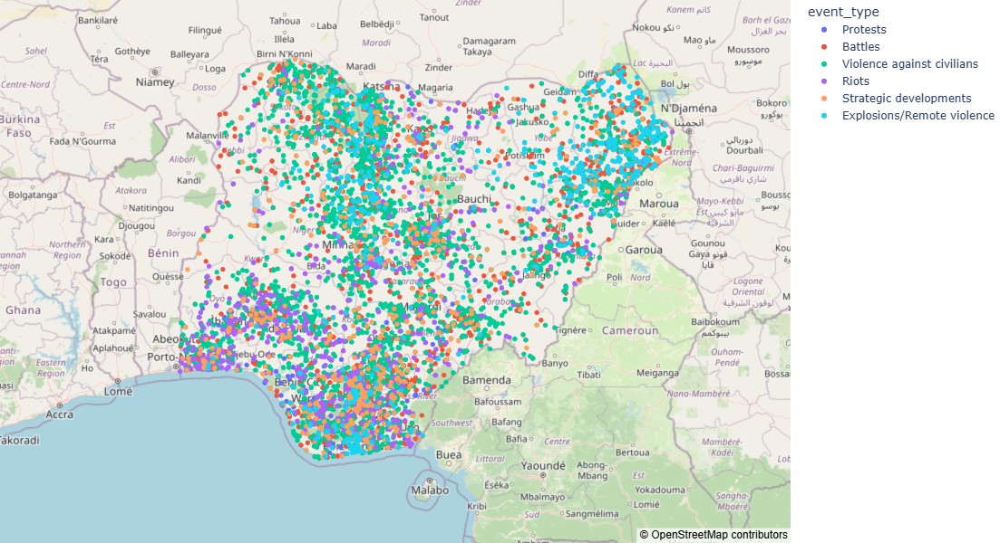

In [94]:
fig = px.scatter_mapbox(
    NigeriaCrimeData,
    lat="latitude",
    lon="longitude",
    hover_name="admin1", 
    hover_data=["event_type", "fatalities"], 
    color="event_type",  
    zoom=5,  
    height=600
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Here are my findings 

1. There has been a significant rise in crime in Nigeria since 2000.
2. Political violence remains the most disruptive issue for the Nigerian people. This majorly happens during election.
3. Violence against civilians is the most common crime, with attacks, armed clashes, and the disruption of peaceful protests as major issues. Abduction and forced disappearances are also prevalent.
4. Borno State in the North East is the most affected, followed by Kaduna, Lagos, and Abuja since 2000.
5. Crime rates have been higher at the beginning of each month over the years, from 2000 to the present.
6. The northern part of Nigeria is a crime hotspot, with the North East geopolitical zone leading, followed by the North West and North Central. In contrast, the South East has maintained relatively lower crime levels compared to other regions over the years.
7. Protests are predominantly organized in the South West, with Lagos leading, indicating a higher level of civic engagement or dissent in that region.
8. The North West records the highest levels of violence against civilians, raising concerns about the safety and security of residents.
9. Kaduna State in the North West has been the leader in violence against civilians since 2000, becoming a hotspot for banditry, armed clashes, kidnappings, and communal conflicts.
10. According to data from the Armed Conflict Location & Event Data (ACLED), the total number of fatalities in Nigeria since 2000 is 116,590.
11. Calculating the average fatalities by geopolitical zone, the North West is the most affected, followed by the North East, and then the North Central.
12. Borno State has the highest number of fatalities over the years since 2000, followed by Plateau, Adamawa, Zamfara, and Yobe and the highest fatalities occur in 2015.
13. The media plays a key role in crime reporting. According to sources, Vanguard (Nigeria) has been the most consistent, followed by Risk and Strategic Management Corporation, Daily Trust (Nigeria), Punch (Nigeria), Daily Post (Nigeria), The Sun (Nigeria), Daily Independence (Nigeria), AFP, Sahara Reporters, All Africa, and others.
14. National news media have been the most consistent in reporting crime-related information across the country, with international media following.
15. Protesters, unidentified armed groups, rioters, Nigerian military forces (2015-2023), and Fulani ethnic militias have been the primary actors involved in violence over the years.

16. Peaceful protesters have been the most frequent victims of violence.
17. Monthly crime trends in the North West, North East, and North Central regions reveal significant fluctuations in criminal activity, with certain months experiencing spikes, reflecting the complex socio-political landscape and varying factors contributing to unrest in these regions. A closer look at the trend reveals that crime tends to occur most frequently at the beginning of the year, as the overall pattern indicates a downward movement thereafter.
18. In the North, battles and explosions/remote violence are most prevalent in the North East, while violence against civilians is most common in the North West. Protests and riots are primarily concentrated in the North Central region.
19. In Borno State, battles and violence against civilians dominate the crime landscape.
20. Borno has the highest fatalities from Violence against civilians
21. The highest fatalities in Borno State occurred in 2015, with 7,615 cases, and in 2014, with 5,655 cases. These numbers are higher than those recorded in any other years since 2000.
22. Crime trends in Borno over the years show a rise in criminal activity, with 2020 seeing the highest surge and Most crimes in Borno State occur in January and December
23. Abuja and Lagos have the highest number of protest incidents, followed by Delta State.
24. Lagos, Abia, Kaduna, Rivers, and the Federal Capital Territory are the most affected by fatalities during protests, in that order.
25. The Nigerian military (2015-2023) has been the leading actor in crime and violations of fundamental rights, followed by Boko Haram and the Islamic State in West Africa (ISWA).


### Understanding the Role of Socio-Political Factors in Nigeria

1. **Poverty and its Impact on Crime and Unrest**
Economic Grievances Leading to Protests: Poverty often creates frustration and anger among affected populations. Protests and violent demonstrations frequently stem from economic hardships like rising costs of living, unemployment, or high transportation and utility expenses. Taxi drivers, residents, and laborers who feel economically marginalized are often at the forefront of such movements.
Example: Protests over high transportation fares or electricity bills highlight the economic pressures felt by those who are already living on the margins of society. These issues can escalate when people feel the government is not addressing their needs.
Link to Crime: In areas where poverty is widespread, crime rates tend to increase as individuals may resort to theft or violence to meet basic needs. Poverty creates environments where desperation pushes people toward illegal activities, worsening the sense of insecurity in affected communities.

2. **Political Instability and Violence**
Armed Clashes: Political instability breeds violence, with militia groups and state forces often clashing over control of territory and resources. These clashes further destabilize regions and make it difficult for governments to provide basic services, exacerbating the underlying economic grievances of the population.
Example: Armed groups like Boko Haram and the Katsina Communal Militia are deeply embedded in conflicts that destabilize the region, causing widespread suffering. These groups exploit the political vacuum created by weak governance and use violence to assert control.
Cyclical Nature of Political Violence: Once political violence begins, it often becomes cyclical, with new factions emerging to challenge existing powers, leading to ongoing conflict and instability. The lack of strong central authority allows these groups to thrive, making the situation more volatile.

3. **Communal Tensions and Ethnic Conflicts**
Ethnic and Identity Conflicts: Many regions plagued by poverty and political instability also face deep-rooted ethnic or communal tensions. These tensions are often exacerbated by competition for limited resources like land, water, or political representation. Historical grievances between ethnic groups can easily ignite into violence, especially when economic pressures are added.
Example: The violent clashes between cult militias in Imo state represent not just criminal activity but also the deeper divisions within the community. These clashes are fueled by competition for local control, resources, and historical disputes over territory or political power.
Mob Violence: Communal tensions often lead to spontaneous mob actions or revenge killings, as communities attempt to settle scores or assert dominance. Without effective state intervention, these conflicts can escalate quickly, contributing to the overall sense of insecurity in the region.

**The Interconnection of Poverty, Political Instability, and Communal Tensions**
These factors often reinforce each other. For example:

Poverty creates economic pressures that lead to protests and sometimes crime.
Political instability fosters environments where armed groups and militias can thrive, feeding into ongoing cycles of violence.
Communal tensions, often rooted in ethnic or historical disputes, are exacerbated by both poverty and political instability, making conflicts over resources or local control more likely to turn violent.

**Addressing the Problems**
To address the root causes of these issues, a multifaceted approach is required:

Economic reforms to alleviate poverty through job creation, fair wages, and improved access to basic services.
Political stability through good governance, addressing corruption, and ensuring that all groups are fairly represented in decision-making processes.
Peace-building efforts to resolve ethnic and communal tensions, focusing on dialogue and mediation to prevent conflicts from escalating.
This approach would help create a more stable and peaceful environment, reducing both crime and social unrest while addressing the underlying causes of these issues.

### Recommendations and law enforcement reforms

1. **Strengthening Law Enforcement and Justice Systems**
Law Enforcement Reforms:
Community Policing: Implement community-oriented policing strategies to foster trust between the police and local communities. This approach allows law enforcement to engage directly with residents, understand their concerns, and address local issues more effectively.

Specialized Crime Units: Establish dedicated units trained to handle specific types of crimes linked to poverty and political instability, such as organized crime, terrorism, and communal violence. These units should work closely with intelligence agencies and local leaders to identify early signs of unrest.

Improved Training and Resources: Provide law enforcement officers with better training in de-escalation techniques, conflict resolution, and human rights abuses. Equip them with modern tools to investigate crimes related to economic grievances and communal tensions more effectively.

Address Corruption: Corruption within law enforcement weakens public trust and undermines efforts to reduce crime. Implement robust internal oversight mechanisms to combat corruption and improve accountability in policing.

Data-Driven Policing: Utilize crime data analysis to identify crime hotspots and deploy resources effectively. This can help in predicting areas most at risk of unrest or criminal activity, allowing for proactive interventions.

2. **Socio-Economic Interventions**
Job Creation Programs:
Target Youth Employment: High unemployment rates, especially among youth, are a major contributor to crime. Governments should implement job creation programs, apprenticeships, and vocational training initiatives targeted at young people to reduce their susceptibility to criminal activities or recruitment by extremist groups.

Entrepreneurship Incentives: Encourage entrepreneurship through microloans, business incubators, and support programs in impoverished communities. Empowering people to start their own businesses can provide an alternative to criminal activity and reduce poverty-driven unrest.

Affordable Public Services:
Subsidize Basic Services: Introduce subsidies or social safety nets for essential services such as transportation, electricity, and housing, particularly for low-income families. Reducing the economic burden on these groups can alleviate some of the root causes of unrest.

Education and Skills Development: Strengthen access to quality education and skills development programs. Investing in education improves economic prospects and reduces the likelihood of crime, particularly in areas facing persistent poverty.

Social Welfare Programs:
Conditional Cash Transfers: Implement or expand cash transfer programs that provide financial assistance to poor households, tied to requirements like school attendance or job training. Such programs can directly reduce the poverty-related grievances that fuel crime and unrest.

Healthcare and Mental Health Support: Improve access to healthcare, including mental health services, especially for those in marginalized communities. Addressing issues like drug addiction or mental illness, which are often linked to poverty, can help reduce crime rates.

3. **Addressing Political Instability**
Conflict Mediation and Dialogue:
Facilitate Peace Talks: Establish peace-building frameworks to mediate between conflicting political factions, militia groups, and ethnic communities. Encourage dialogue that addresses underlying grievances, resource disputes, and political exclusion.

Inclusive Governance: Promote policies that ensure fair representation of marginalized groups in governance. Political instability often arises from exclusion, and creating a more inclusive political system can help mitigate conflicts and reduce violence.

Strengthen Government Institutions:
Transparent Governance: Ensure government institutions are transparent and accountable. Reducing corruption and ensuring efficient delivery of services can address political grievances that lead to unrest.

Security Sector Reforms: Enhance the capacity of the military and security forces to maintain order while respecting human rights. The presence of well-trained and disciplined forces can deter armed militias and prevent escalations of political violence.

4. **Addressing Communal Tensions and Ethnic Conflicts**
Promoting Social Cohesion:
Inter-Ethnic Dialogue Initiatives: Facilitate dialogue and peace-building initiatives that bring together leaders from different ethnic or communal groups. Address historical grievances through reconciliation programs and promote cooperation over resource-sharing.

Community Conflict Resolution Mechanisms: Establish or strengthen local conflict resolution mechanisms, including traditional courts or councils, where disputes over land, resources, or local power can be addressed peacefully.

Resource Distribution and Land Reform:
Equitable Resource Distribution: Address the root causes of communal violence by ensuring fair distribution of resources such as land and government benefits. Disputes over land, water, or other resources often lead to communal conflicts, so transparent and fair resource allocation policies are crucial.

Land Ownership Reforms: Implement land reforms where necessary to address historical grievances that drive communal tensions. Providing secure land ownership or usage rights to communities can help prevent conflicts related to resource competition.

5. **Community-Level Solutions for Crime Prevention**
Neighborhood Watch Programs: Encourage community-driven initiatives like neighborhood watch groups to collaborate with local law enforcement. These programs empower residents to take a proactive role in improving security and preventing petty crimes.

Youth and Sports Programs: Implement sports and cultural programs for young people in vulnerable areas. Such programs foster social interaction, reduce idleness, and provide positive outlets for youth, steering them away from criminal behavior or involvement in violence.

Local Economic Development Initiatives: Support local economic development initiatives aimed at reducing poverty within communities. This can include cooperatives, community savings groups, or agricultural development projects that improve livelihoods and reduce economic grievances.

6. **Crime Prevention through Environmental Design**
Urban Planning: Design urban environments that minimize opportunities for crime through better lighting, surveillance, and community spaces. Crime prevention through environmental design involves creating spaces that encourage positive social interaction and make it difficult for criminals to operate.

Infrastructure Investments: Invest in infrastructure development in poor and marginalized areas. Roads, schools, health clinics, and public utilities can improve living standards and reduce the conditions that breed criminal activities.

**Conclusion:**
Addressing the complex interplay of poverty, political instability, and communal tensions requires a combination of law enforcement reforms, socio-economic interventions, and community-level solutions. By focusing on these areas, governments can reduce crime rates, prevent social unrest, and create more stable and peaceful societies. Policies that promote inclusivity, transparency, and fairness in resource allocation are essential to achieving long-term crime prevention and improving public safety.

### Crime Prevention Framework

A sustainable and adaptive crime prevention framework for Nigeria must consider the country's unique socio-economic and political landscape. Below is an outline of key components for an ongoing crime monitoring and prevention strategy that addresses the root causes of crime, promotes community involvement, and leverages technology and data analysis:

A. **Data-Driven Crime Monitoring**
Establish a Central Crime Monitoring System:
Develop a centralized database that collects real-time crime data from all states. Law enforcement agencies can feed into this system, allowing for the tracking of crime trends, hotspots, and repeat offenders.

Utilize predictive analytics to forecast potential crime surges in vulnerable areas based on past incidents and socio-economic indicators such as unemployment rates, poverty levels, and political tensions.

Community Reporting Platforms:
Launch easy-to-use digital platforms (via mobile apps or SMS) where citizens can report crimes anonymously. This empowers communities and encourages active participation in crime prevention.

Partner with local organizations, religious groups, and community leaders to promote trust in these systems and ensure accurate reporting.

B. **Integrated Law Enforcement Strategies**
Cross-Agency Collaboration:
Facilitate collaboration between the police, military, intelligence agencies, and local law enforcement. This integrated approach ensures that information is shared effectively, reducing response times and enhancing situational awareness.

Create joint task forces to tackle specific issues like gang violence, terrorism, and political militias, allowing for a targeted approach based on available data.

Accountability and Oversight:
Implement transparent oversight mechanisms for law enforcement agencies to ensure that they are following proper procedures and maintaining community trust.

Create an independent commission to investigate police corruption, misconduct, and inefficiencies, ensuring that law enforcement bodies remain effective and fair.

C. **Community-Centered Prevention Programs**
Community Policing:
Expand community policing efforts where officers are embedded within local neighborhoods to build trust and collaborate with residents on crime prevention initiatives.

Provide incentives for communities that actively participate in crime prevention efforts, such as public safety grants or improved infrastructure support for those involved in neighborhood watch programs.

Youth Engagement and Rehabilitation:
Introduce programs aimed at preventing youth crime, such as mentorship, vocational training, and sports initiatives. These efforts should be led by community leaders and involve former offenders to provide credible role models.

Implement rehabilitation programs within prisons and reintegration initiatives for ex-convicts, helping them re-enter society with employment opportunities and mental health support.

D. **Technological Integration and Surveillance**
Smart City Technologies:
Deploy smart city solutions such as CCTV cameras, facial recognition, and drones in high-crime urban areas. These technologies can improve the ability to monitor public spaces, gather evidence, and deter criminal activity.

Cybercrime and Digital Intelligence:
Strengthen the capabilities of law enforcement to detect and prevent cybercrime, especially as digital financial fraud and online crimes increase in Nigeria.

Enhance digital forensic training for law enforcement officers to investigate online criminal activities, monitor illicit transactions, and trace organized crime networks.

E. **Socio-Economic Interventions**
Poverty Alleviation Programs:
Continue expanding access to government welfare programs targeting the most impoverished areas, providing not just financial aid but also education, healthcare, and job training to reduce the desperation that often leads to criminal activity.

Targeted Employment Initiatives:
Create localized job creation schemes in high-crime regions, with a focus on youth, ex-offenders, and marginalized communities. Engaging the private sector to invest in these areas through tax incentives or public-private partnerships will generate sustainable employment.

F. **Monitoring and Evaluation**
Annual Crime Impact Reviews:
Conduct annual reviews of crime trends, law enforcement effectiveness, and socio-economic factors contributing to criminal behavior. These reviews should be led by an independent body that can recommend changes to the crime prevention strategy based on evolving data and conditions.

Community Feedback Mechanisms:
Implement feedback systems that allow communities to provide input on the effectiveness of local crime prevention programs. This feedback can help adjust strategies and ensure that initiatives remain responsive to the needs of the population.

Adaptive Policy-Making:
Build flexibility into the framework so that policy responses can be adjusted in response to changing social, economic, and political conditions. This ensures that the strategy remains relevant over time and can adapt to new threats or challenges.

### Conclusion

Analyzing crime rates in Nigeria reveals complex patterns influenced by various socio-economic, political, and communal factors. High levels of poverty, political instability, and ethnic tensions significantly contribute to the prevalence of crime across different regions. Understanding these underlying causes is essential for developing effective prevention strategies.

Addressing crime in Nigeria requires a multifaceted approach, incorporating data-driven crime monitoring, law enforcement reforms, and community-based interventions. Strengthening social welfare programs, improving economic opportunities, and fostering collaboration between law enforcement and local communities will be crucial in reducing crime rates and enhancing public safety.

In conclusion, a comprehensive and adaptive crime prevention framework is key to tackling the root causes of crime and ensuring long-term stability in Nigeria. By combining technological advancements, socio-economic initiatives, and policy reforms, Nigeria can move towards a safer and more secure future.